In [16]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/student-performance-factors/StudentPerformanceFactors.csv


In [17]:
df=pd.read_csv('/kaggle/input/student-performance-factors/StudentPerformanceFactors.csv')

In [18]:
df.head()

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70


In [19]:
df.shape

(6607, 20)

In [20]:
rows=df.shape[0]
cols=df.shape[1]
print(rows,cols)

6607 20


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6607 entries, 0 to 6606
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Hours_Studied               6607 non-null   int64 
 1   Attendance                  6607 non-null   int64 
 2   Parental_Involvement        6607 non-null   object
 3   Access_to_Resources         6607 non-null   object
 4   Extracurricular_Activities  6607 non-null   object
 5   Sleep_Hours                 6607 non-null   int64 
 6   Previous_Scores             6607 non-null   int64 
 7   Motivation_Level            6607 non-null   object
 8   Internet_Access             6607 non-null   object
 9   Tutoring_Sessions           6607 non-null   int64 
 10  Family_Income               6607 non-null   object
 11  Teacher_Quality             6529 non-null   object
 12  School_Type                 6607 non-null   object
 13  Peer_Influence              6607 non-null   obje

Eliminate duplicates

In [22]:
df.duplicated().sum()

0

In [23]:
df.drop_duplicates(inplace=True)

In [24]:
df.isnull().sum()

Hours_Studied                  0
Attendance                     0
Parental_Involvement           0
Access_to_Resources            0
Extracurricular_Activities     0
Sleep_Hours                    0
Previous_Scores                0
Motivation_Level               0
Internet_Access                0
Tutoring_Sessions              0
Family_Income                  0
Teacher_Quality               78
School_Type                    0
Peer_Influence                 0
Physical_Activity              0
Learning_Disabilities          0
Parental_Education_Level      90
Distance_from_Home            67
Gender                         0
Exam_Score                     0
dtype: int64

In [25]:
# Handling outlier
# p25=df['col'].quantile(0.25)
# p75=df['col'].quantile(0.75)
# iqr=p75-p25
# lower=p25-1.5*iqr
# upper=p75+1.5*iqr
# df[df['col']>=lower && df['col']<=upper]
# this can be applied to any numerical cols whereever required

Handling missing values

In [26]:
# we can drop or fill the missing values
# in this case the missing values are very low ,we can drop them .

In [27]:
# df['Distance_from_Home'].dropna(inplace=True)
# df['Distance_from_Home'].fillna(method='ffill',inplace=True) 
# - fill with forward value
# df['Distance_from_Home'].fillna(method='bfill',inplace=True) - fill with backward value

In [28]:
# df['Parental_Education_Level'].dropna()
# df['Parental_Education_Level'].fillna(method='ffill',inplace=True)
# df['Parental_Education_Level'].fillna(method='bfill',inplace=True)

In [29]:
# df['Teacher_Quality'].dropna()
# df['Teacher_Quality'].fillna(method='ffill',inplace=True)
# df['Teacher_Quality'].fillna(method='bfill',inplace=True)

Statistics of the data set .

In [30]:
df.describe()

,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Exam_Score
count,6607.000000,6607.000000,6607.00000,6607.000000,6607.000000,6607.000000,6607.000000
mean,19.975329,79.977448,7.02906,75.070531,1.493719,2.967610,67.235659
std,5.990594,11.547475,1.46812,14.399784,1.230570,1.031231,3.890456
min,1.000000,60.000000,4.00000,50.000000,0.000000,0.000000,55.000000
25%,16.000000,70.000000,6.00000,63.000000,1.000000,2.000000,65.000000
50%,20.000000,80.000000,7.00000,75.000000,1.000000,3.000000,67.000000
75%,24.000000,90.000000,8.00000,88.000000,2.000000,4.000000,69.000000
max,44.000000,100.000000,10.00000,100.000000,8.000000,6.000000,101.000000


Analysis of univariate variable

In [31]:
cols=df.columns
cols

Index(['Hours_Studied', 'Attendance', 'Parental_Involvement',
       'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours',
       'Previous_Scores', 'Motivation_Level', 'Internet_Access',
       'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type',
       'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities',
       'Parental_Education_Level', 'Distance_from_Home', 'Gender',
       'Exam_Score'],
      dtype='object')

In [32]:
import matplotlib.pyplot as plt


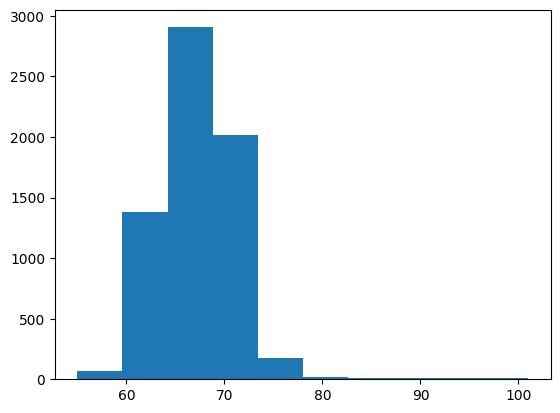

In [33]:
plt.hist(df['Exam_Score'])
plt.show()

Separating Categorical and numerical cols

In [34]:
cat=[]
num=[]
for i in cols:
    if df[i].nunique()<=10:
        cat.append(i)
    else:
        num.append(i)

In [35]:
print(cat)

['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours', 'Motivation_Level', 'Internet_Access', 'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender']


<Axes: ylabel='count'>

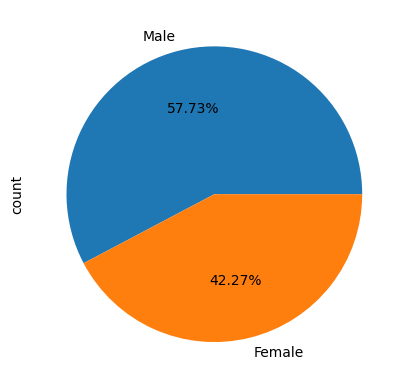

In [36]:
df['Gender'].value_counts().plot(kind='pie',labels=df['Gender'].value_counts().index,autopct='%0.2f%%')

<Axes: xlabel='Gender'>

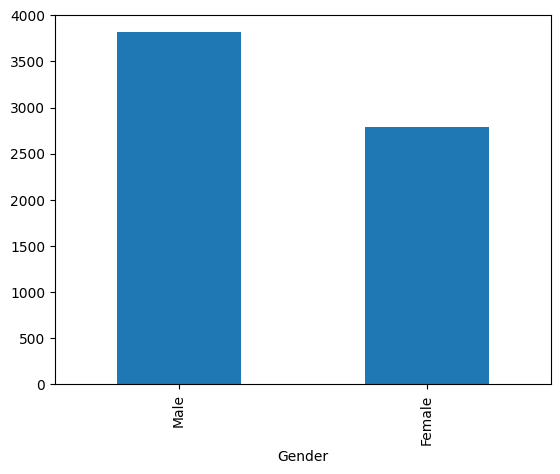

In [37]:
df['Gender'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

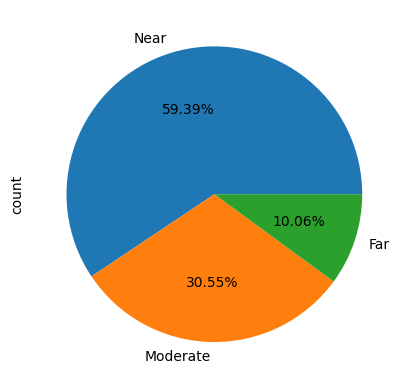

In [38]:
df['Distance_from_Home'].value_counts().plot(kind='pie',labels=df['Distance_from_Home'].value_counts().index,autopct='%0.2f%%')

<Axes: xlabel='Distance_from_Home'>

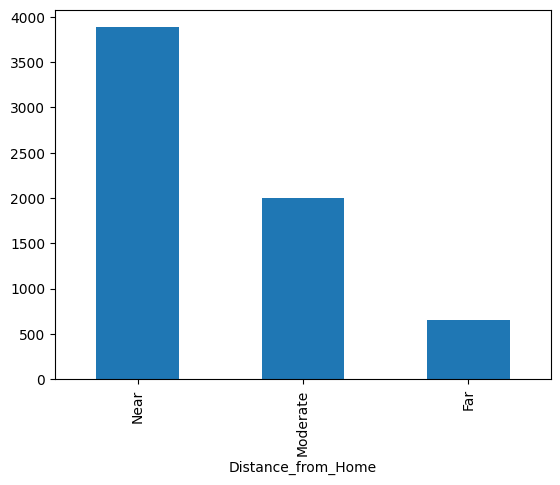

In [39]:
df['Distance_from_Home'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

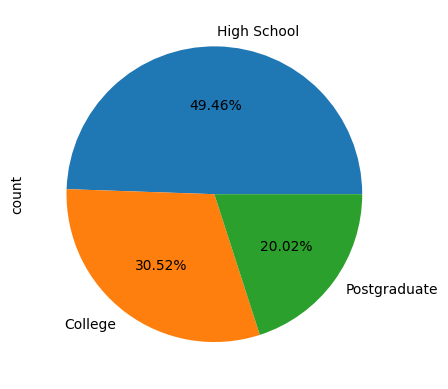

In [40]:
df['Parental_Education_Level'].value_counts().plot(kind='pie',labels=df['Parental_Education_Level'].value_counts().index,autopct='%0.2f%%')

<Axes: xlabel='Parental_Education_Level'>

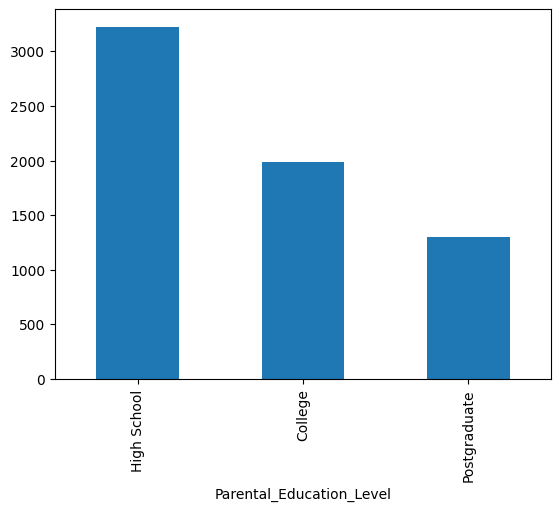

In [41]:
df['Parental_Education_Level'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

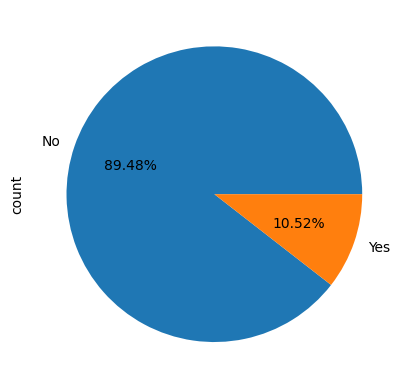

In [42]:
df['Learning_Disabilities'].value_counts().plot(kind='pie',labels=df['Learning_Disabilities'].value_counts().index,autopct='%0.2f%%')

<Axes: xlabel='Learning_Disabilities'>

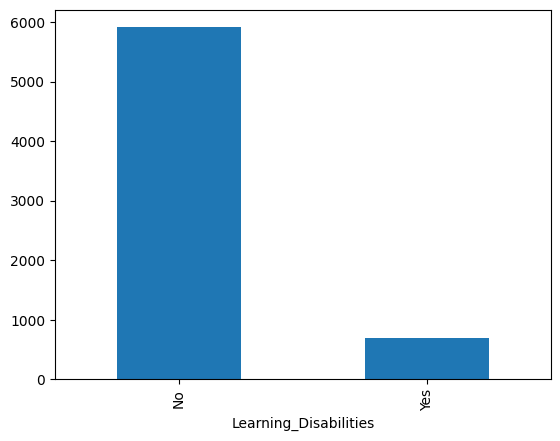

In [43]:
df['Learning_Disabilities'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

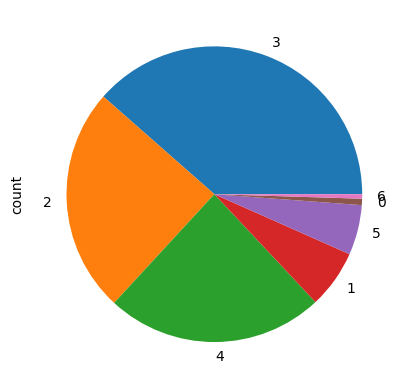

In [44]:
df['Physical_Activity'].value_counts().plot(kind='pie')

<Axes: xlabel='Physical_Activity'>

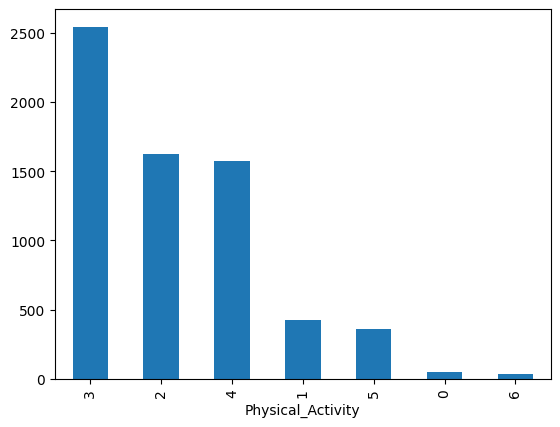

In [45]:
df['Physical_Activity'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

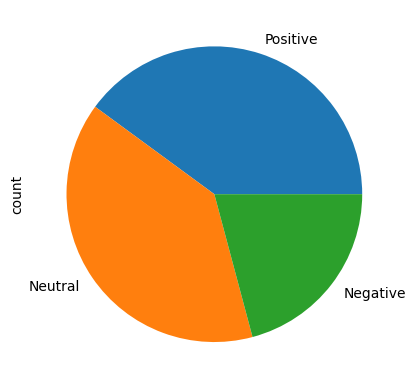

In [46]:
df['Peer_Influence'].value_counts().plot(kind='pie')

<Axes: xlabel='Peer_Influence'>

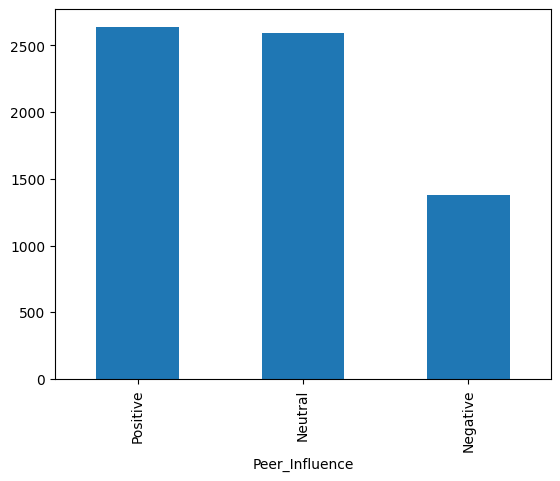

In [47]:
df['Peer_Influence'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

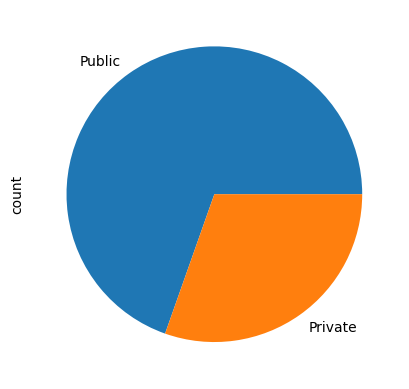

In [48]:
df['School_Type'].value_counts().plot(kind='pie')

<Axes: xlabel='School_Type'>

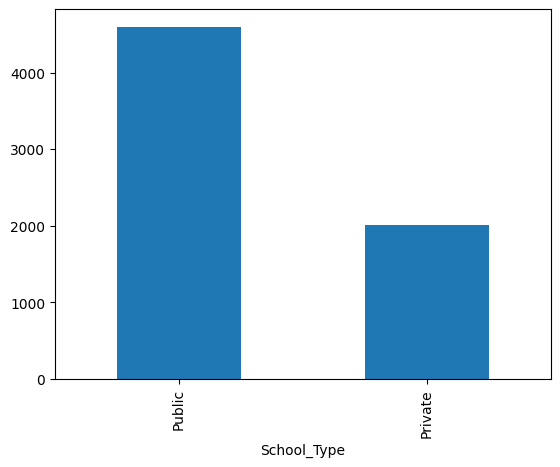

In [49]:
df['School_Type'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

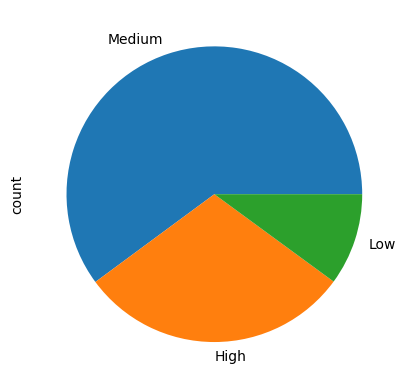

In [50]:
df['Teacher_Quality'].value_counts().plot(kind='pie')

<Axes: xlabel='Teacher_Quality'>

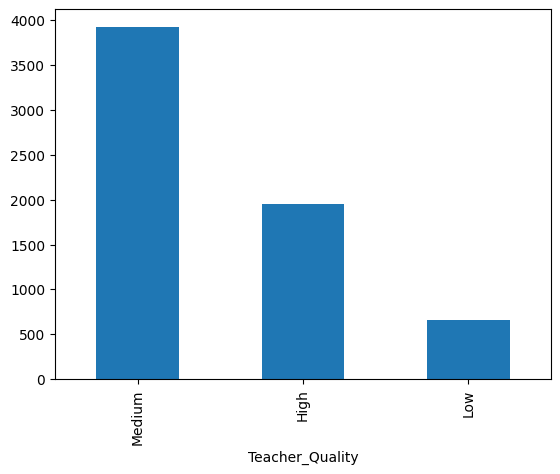

In [51]:
df['Teacher_Quality'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

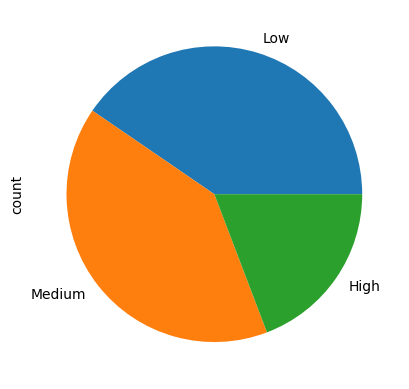

In [52]:
df['Family_Income'].value_counts().plot(kind='pie')

<Axes: xlabel='Family_Income'>

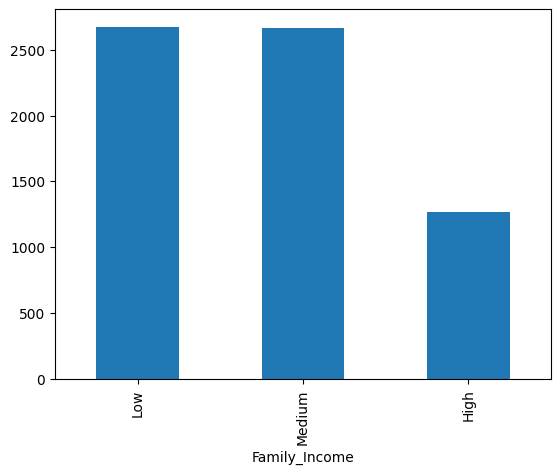

In [53]:
df['Family_Income'].value_counts().plot(kind='bar')

<Axes: xlabel='Tutoring_Sessions'>

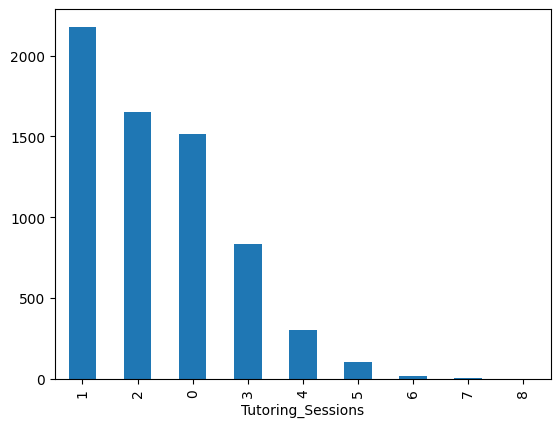

In [54]:
df['Tutoring_Sessions'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

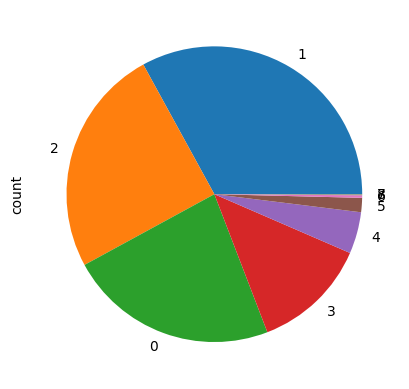

In [55]:
df['Tutoring_Sessions'].value_counts().plot(kind='pie')

<Axes: ylabel='count'>

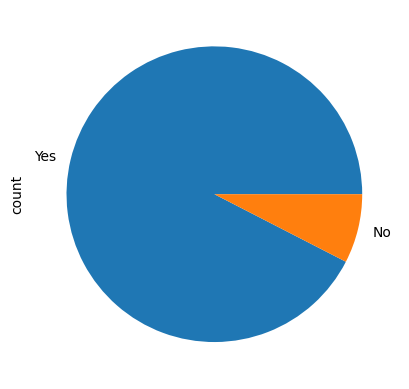

In [56]:
df['Internet_Access'].value_counts().plot(kind='pie')

<Axes: xlabel='Internet_Access'>

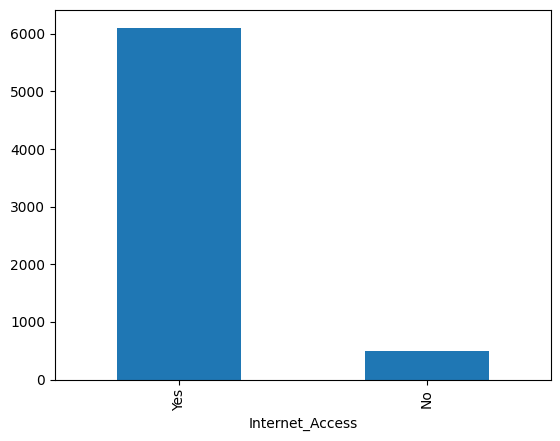

In [57]:
df['Internet_Access'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

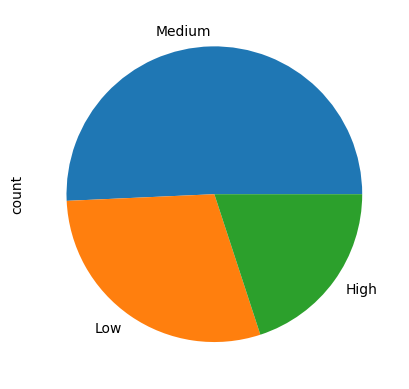

In [58]:
df['Motivation_Level'].value_counts().plot(kind='pie')

<Axes: xlabel='Motivation_Level'>

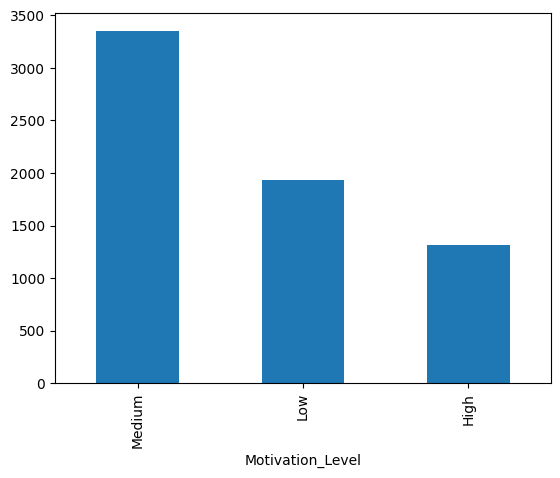

In [59]:
df['Motivation_Level'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

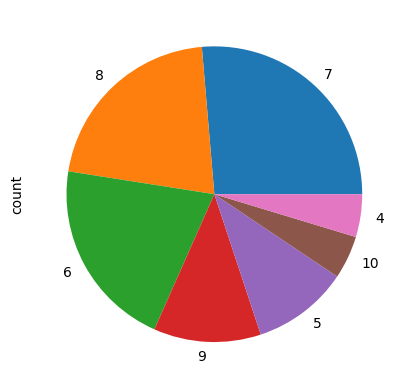

In [60]:
df['Sleep_Hours'].value_counts().plot(kind='pie')

<Axes: xlabel='Sleep_Hours'>

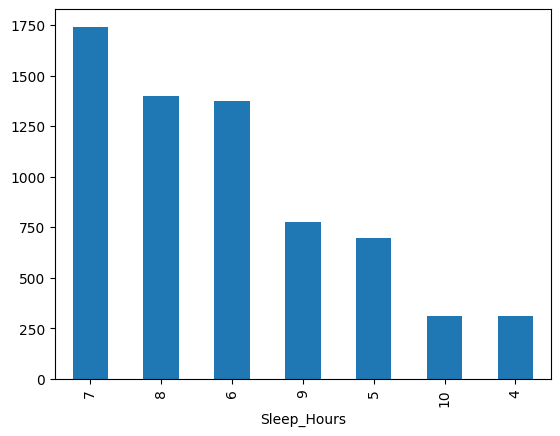

In [61]:
df['Sleep_Hours'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

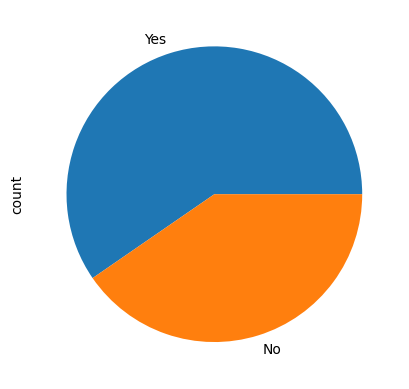

In [62]:
df['Extracurricular_Activities'].value_counts().plot(kind='pie')

<Axes: xlabel='Extracurricular_Activities'>

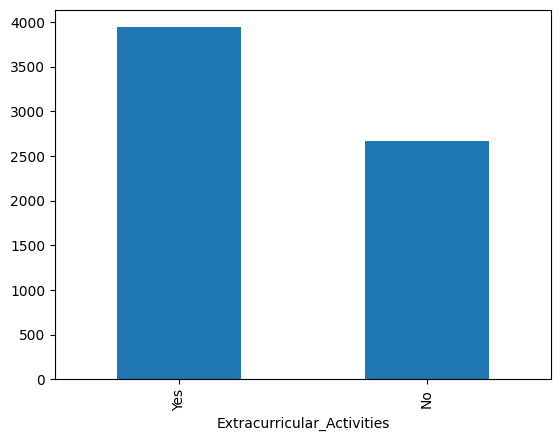

In [63]:
df['Extracurricular_Activities'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

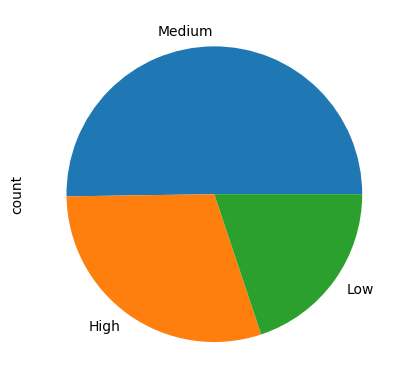

In [64]:
df['Access_to_Resources'].value_counts().plot(kind='pie')

<Axes: xlabel='Access_to_Resources'>

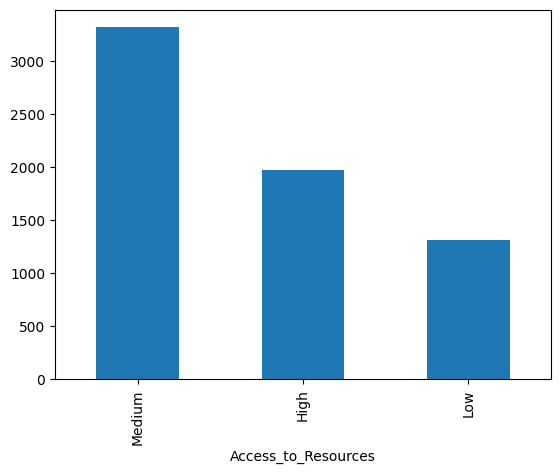

In [65]:
df['Access_to_Resources'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

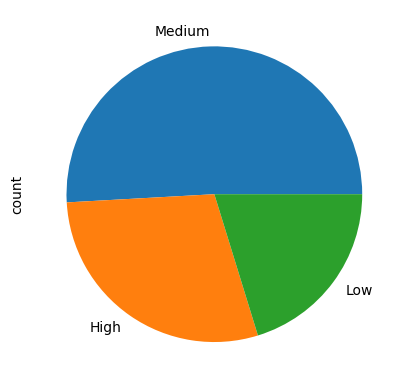

In [66]:
df['Parental_Involvement'].value_counts().plot(kind='pie')

<Axes: xlabel='Parental_Involvement'>

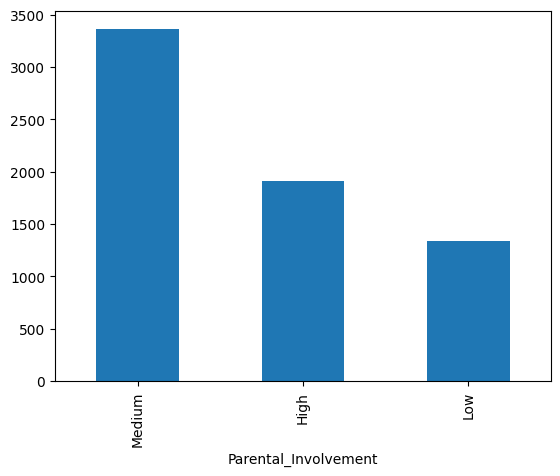

In [67]:
df['Parental_Involvement'].value_counts().plot(kind='bar')

Analysis of numerical columns

In [68]:
num

['Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score']

In [69]:
import seaborn as sns

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Exam_Score', ylabel='Density'>

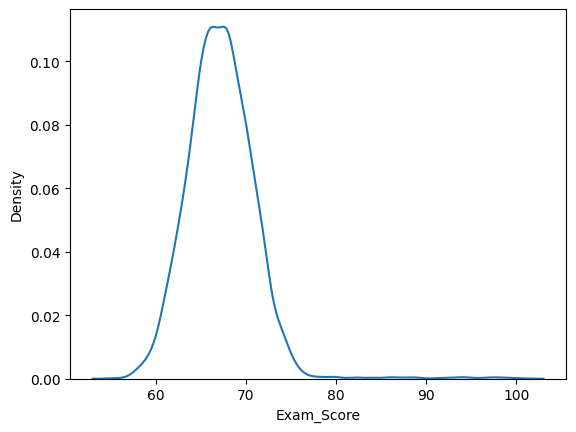

In [70]:
sns.kdeplot(df['Exam_Score'])

/tmp/ipykernel_30/4271735307.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Exam_Score'])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Exam_Score', ylabel='Density'>

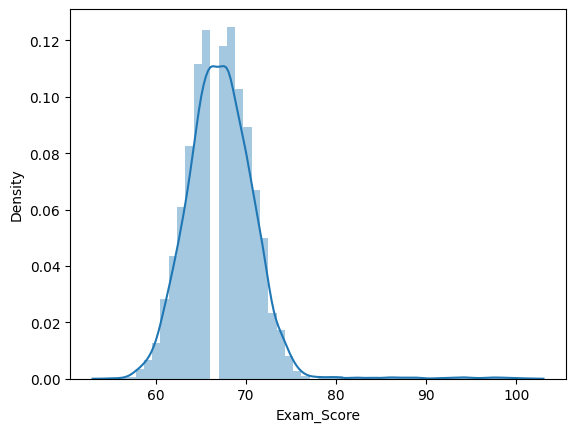

In [71]:
sns.distplot(df['Exam_Score'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Exam_Score', ylabel='Count'>

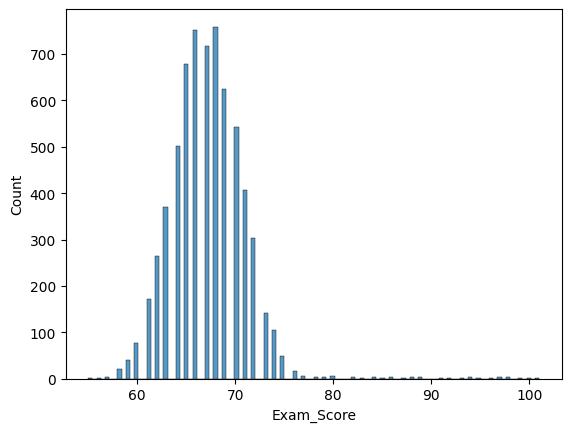

In [72]:
sns.histplot(df['Exam_Score'])

<Axes: >

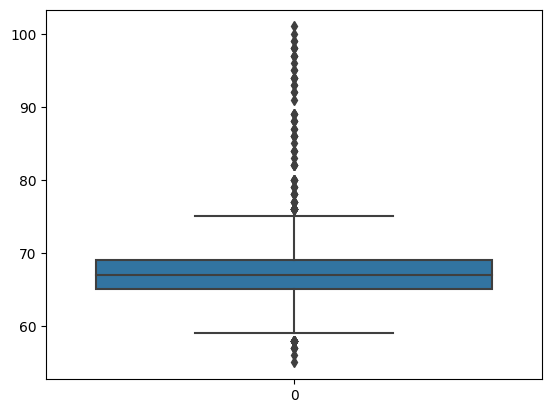

In [73]:
sns.boxplot(df['Exam_Score'])

/tmp/ipykernel_30/4127755963.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Previous_Scores'])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Previous_Scores', ylabel='Density'>

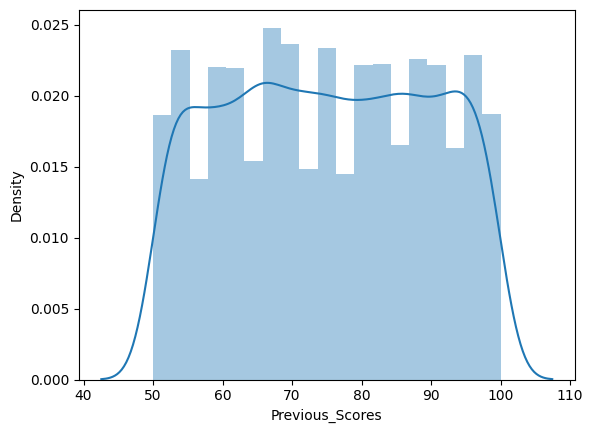

In [74]:
sns.distplot(df['Previous_Scores'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Previous_Scores', ylabel='Density'>

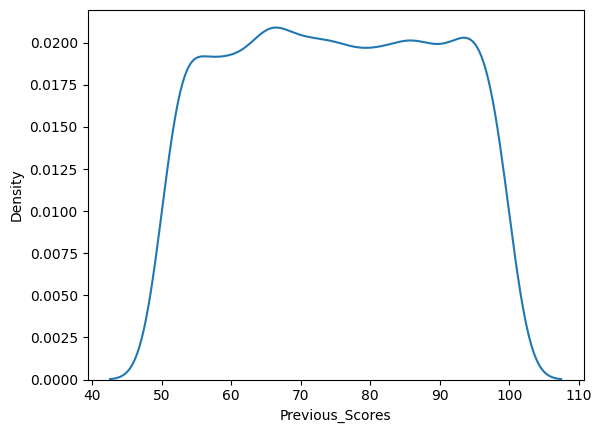

In [75]:
sns.kdeplot(df['Previous_Scores'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Previous_Scores', ylabel='Count'>

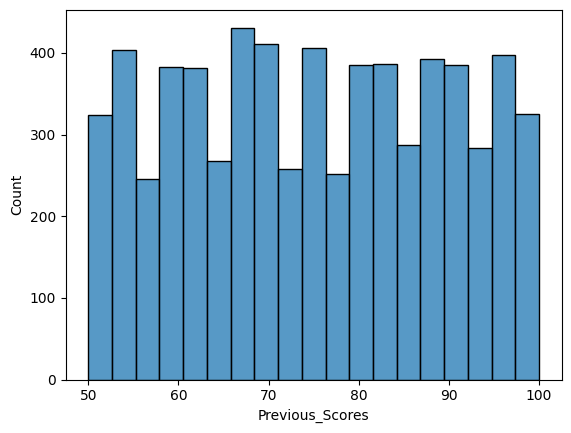

In [76]:
sns.histplot(df['Previous_Scores'])

<Axes: >

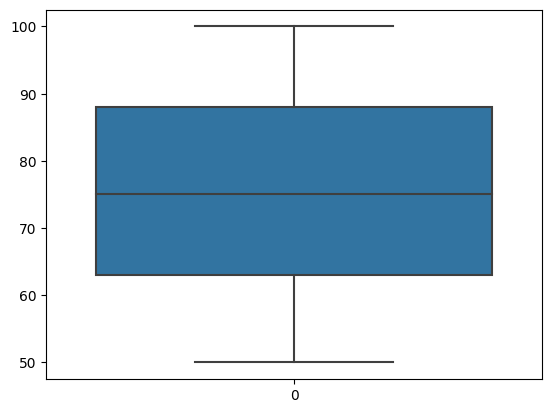

In [77]:
sns.boxplot(df['Previous_Scores'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Attendance', ylabel='Density'>

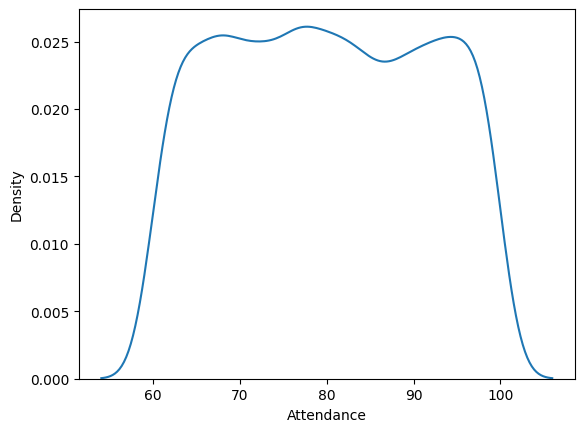

In [78]:
sns.kdeplot(df['Attendance'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Attendance', ylabel='Count'>

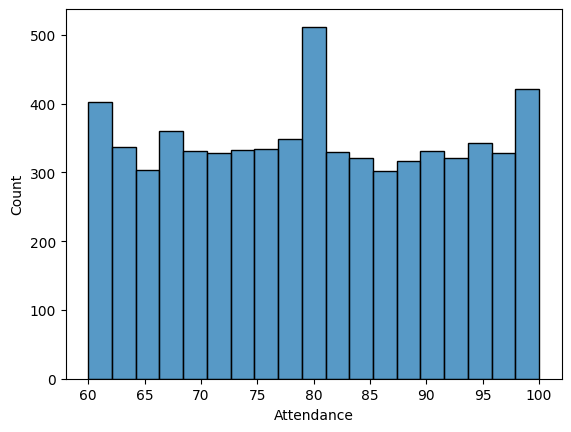

In [79]:
sns.histplot(df['Attendance'])

/tmp/ipykernel_30/3788470848.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Attendance'])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Attendance', ylabel='Density'>

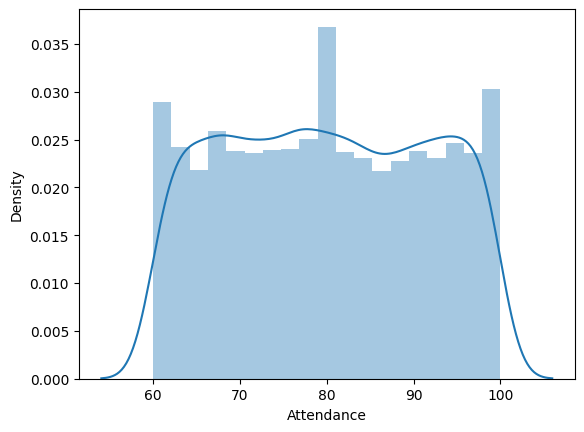

In [80]:
sns.distplot(df['Attendance'])

<Axes: >

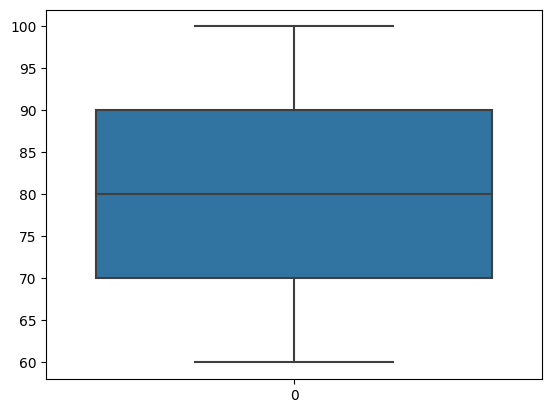

In [81]:
sns.boxplot(df['Attendance'])

<Axes: >

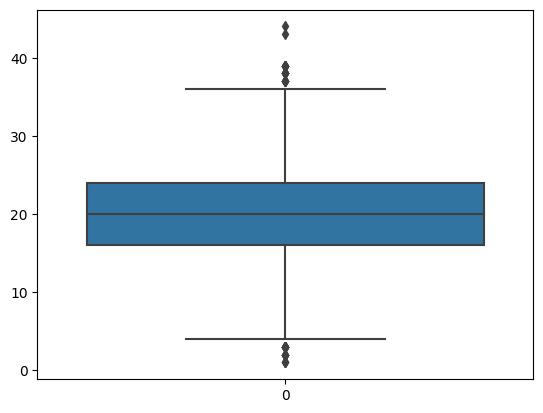

In [82]:
sns.boxplot(df['Hours_Studied'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Hours_Studied', ylabel='Density'>

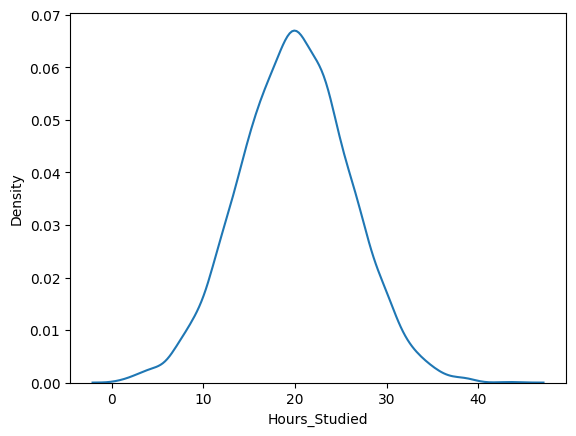

In [83]:
sns.kdeplot(df['Hours_Studied'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Hours_Studied', ylabel='Count'>

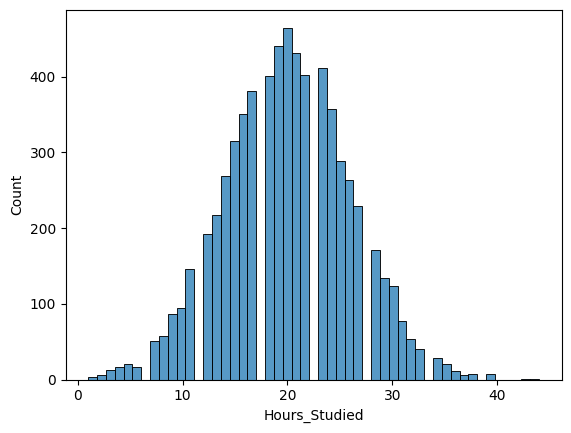

In [84]:
sns.histplot(df['Hours_Studied'])

/tmp/ipykernel_30/3252461645.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Hours_Studied'])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Hours_Studied', ylabel='Density'>

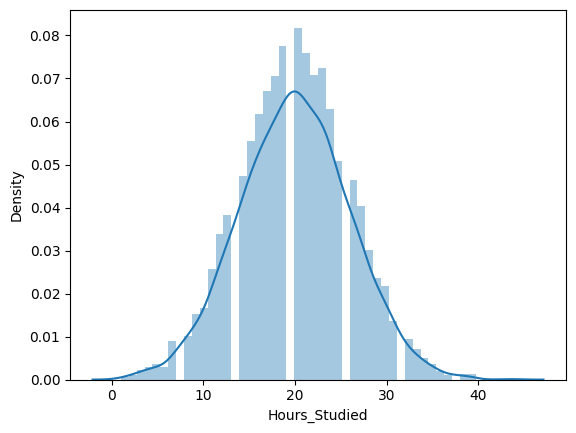

In [85]:
sns.distplot(df['Hours_Studied'])

Multivariate Analysis


Numerical-Numerical

'Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score'

<Axes: xlabel='Hours_Studied', ylabel='Previous_Scores'>

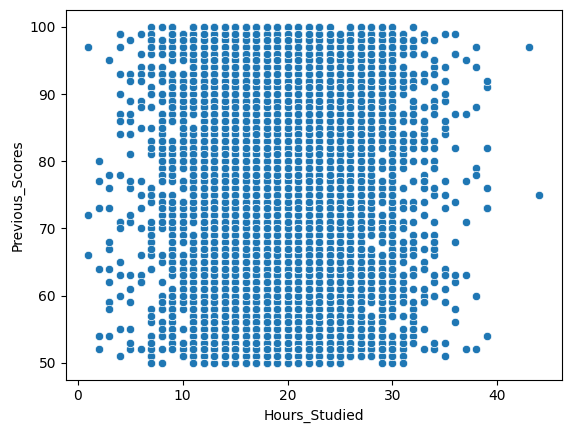

In [86]:
sns.scatterplot(x=df['Hours_Studied'],y=df['Previous_Scores'])

<Axes: xlabel='Attendance', ylabel='Previous_Scores'>

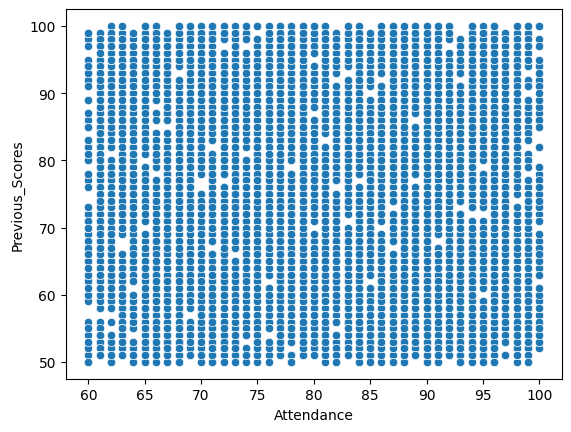

In [87]:
sns.scatterplot(x=df['Attendance'],y=df['Previous_Scores'])

<Axes: xlabel='Previous_Scores', ylabel='Exam_Score'>

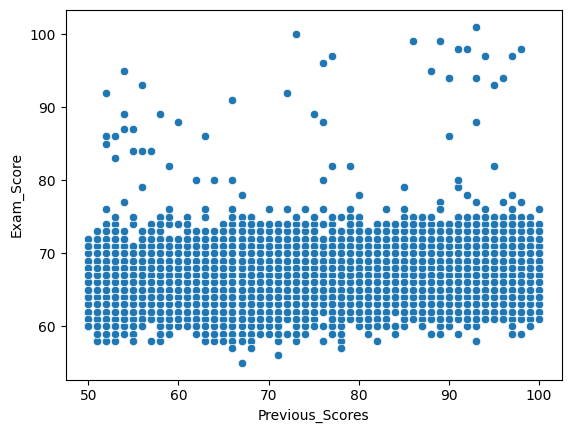

In [88]:
sns.scatterplot(x=df['Previous_Scores'],y=df['Exam_Score'])

<Axes: xlabel='Attendance', ylabel='Exam_Score'>

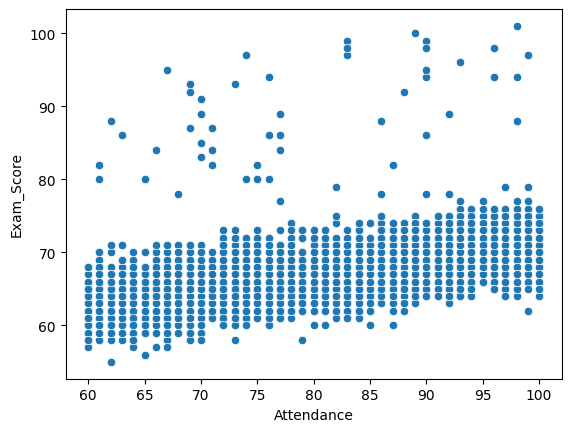

In [89]:
sns.scatterplot(x=df['Attendance'],y=df['Exam_Score'])

<Axes: xlabel='Hours_Studied', ylabel='Exam_Score'>

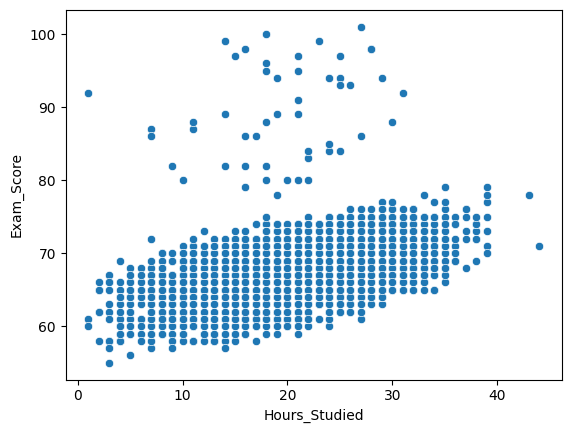

In [90]:
sns.scatterplot(x=df['Hours_Studied'],y=df['Exam_Score'])

<Axes: xlabel='Hours_Studied', ylabel='Attendance'>

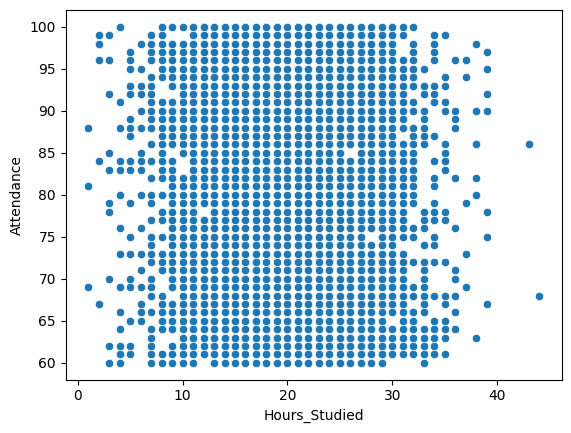

In [91]:
sns.scatterplot(x=df['Hours_Studied'],y=df['Attendance'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

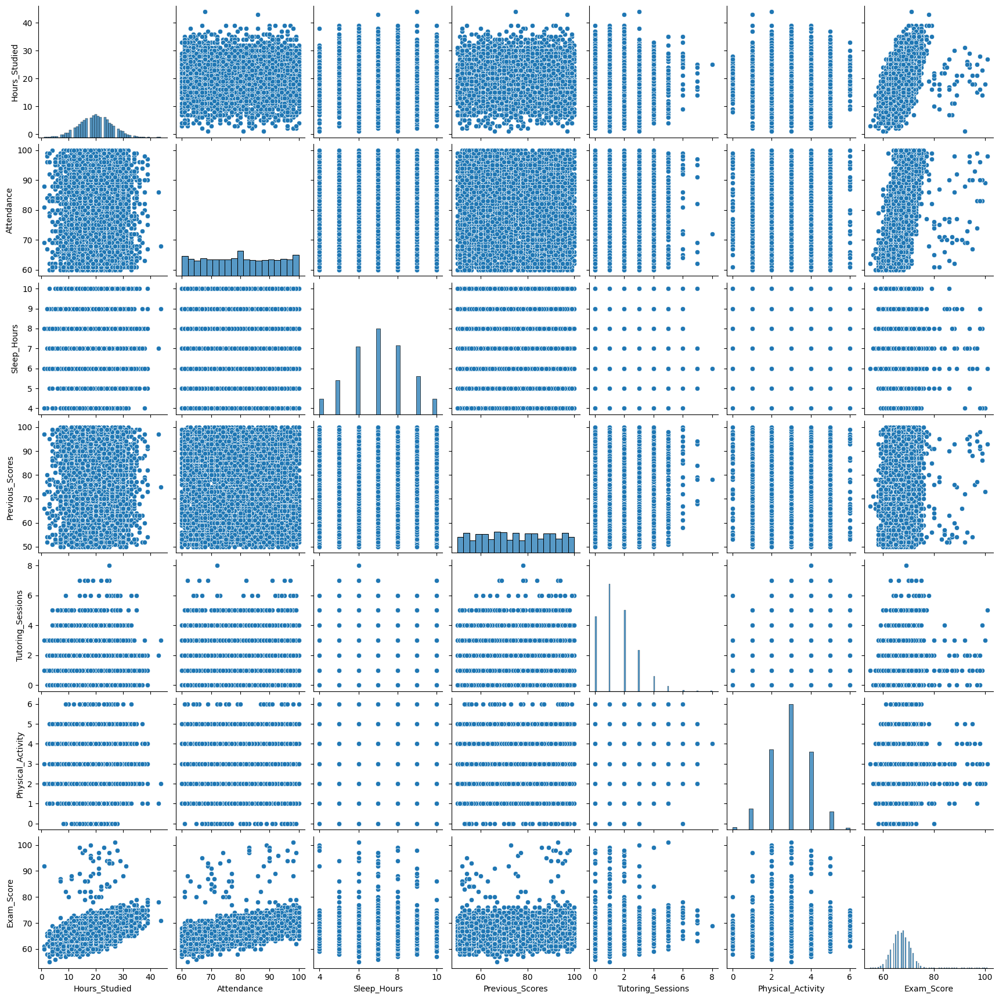

In [92]:
sns.pairplot(df)

In [93]:
df.corr(numeric_only=True)

,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Exam_Score
Hours_Studied,1.000000,-0.009908,0.010977,0.024846,-0.014282,0.004624,0.445455
Attendance,-0.009908,1.000000,-0.015918,-0.020186,0.014324,-0.022435,0.581072
Sleep_Hours,0.010977,-0.015918,1.000000,-0.021750,-0.012216,-0.000378,-0.017022
Previous_Scores,0.024846,-0.020186,-0.021750,1.000000,-0.013122,-0.011274,0.175079
Tutoring_Sessions,-0.014282,0.014324,-0.012216,-0.013122,1.000000,0.017733,0.156525
Physical_Activity,0.004624,-0.022435,-0.000378,-0.011274,0.017733,1.000000,0.027824
Exam_Score,0.445455,0.581072,-0.017022,0.175079,0.156525,0.027824,1.000000


<Axes: >

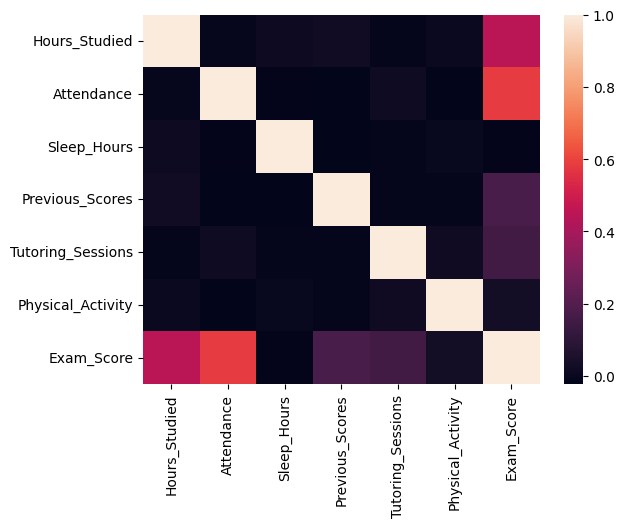

In [94]:
sns.heatmap(df.corr(numeric_only=True))

Categorical- Numerical

'Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours', 'Motivation_Level', 'Internet_Access', 'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender'


Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score'

In [95]:
from scipy.stats import chi2_contingency

In [96]:
chi2,p,dof,exp=chi2_contingency(pd.crosstab(df['Parental_Involvement'],df['Exam_Score']))

In [97]:
chi2,p,dof,exp

(301.9052352179872,
 3.1272304213366265e-25,
 88,
 array([[2.88784622e-01, 2.88784622e-01, 1.15513849e+00, 6.35326169e+00,
         1.15513849e+01, 2.22364159e+01, 4.93821704e+01, 7.62391403e+01,
         1.07139095e+02, 1.44681096e+02, 1.96084759e+02, 2.16877251e+02,
         2.07058574e+02, 2.19187528e+02, 1.80201604e+02, 1.56521265e+02,
         1.17824126e+02, 8.77905252e+01, 4.07186318e+01, 3.06111700e+01,
         1.38616619e+01, 4.62055396e+00, 1.44392311e+00, 1.15513849e+00,
         8.66353867e-01, 1.44392311e+00, 1.15513849e+00, 2.88784622e-01,
         8.66353867e-01, 2.88784622e-01, 1.15513849e+00, 5.77569245e-01,
         8.66353867e-01, 8.66353867e-01, 2.88784622e-01, 5.77569245e-01,
         5.77569245e-01, 1.15513849e+00, 5.77569245e-01, 2.88784622e-01,
         8.66353867e-01, 8.66353867e-01, 5.77569245e-01, 2.88784622e-01,
         2.88784622e-01],
        [2.02361132e-01, 2.02361132e-01, 8.09444529e-01, 4.45194491e+00,
         8.09444529e+00, 1.55818072e+01, 3.46037

<Axes: xlabel='Parental_Involvement', ylabel='Exam_Score'>

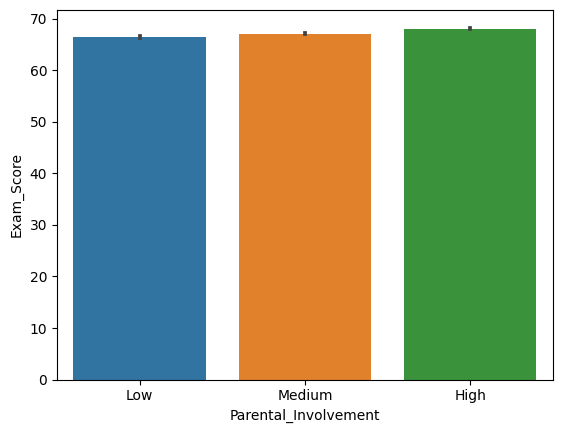

In [98]:
sns.barplot(data=df,x='Parental_Involvement',y='Exam_Score')

<Axes: xlabel='Parental_Involvement', ylabel='Exam_Score'>

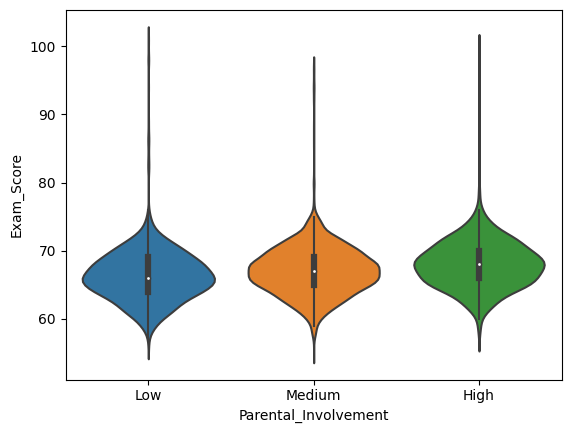

In [99]:
sns.violinplot(data=df,x='Parental_Involvement',y='Exam_Score')

<Axes: xlabel='Parental_Involvement', ylabel='Exam_Score'>

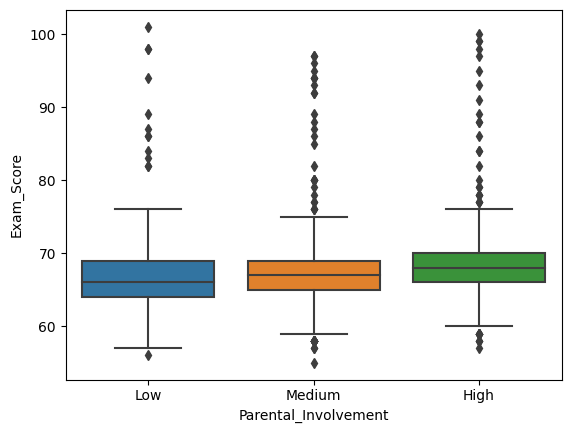

In [100]:
sns.boxplot(data=df,x='Parental_Involvement',y='Exam_Score')

Plotting bar plots 

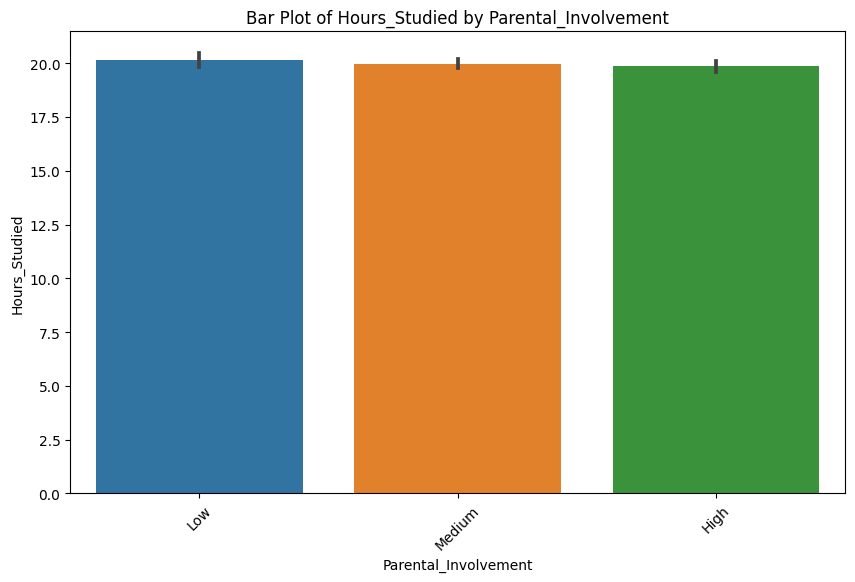

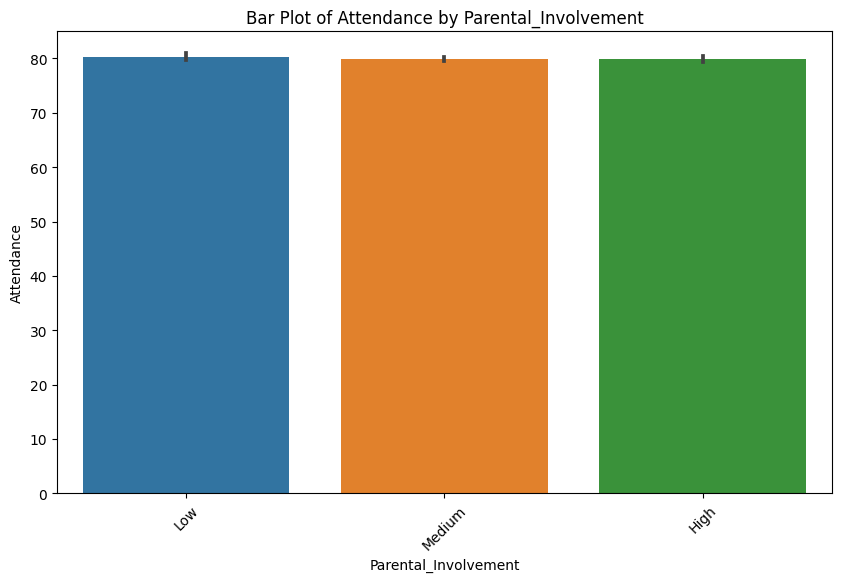

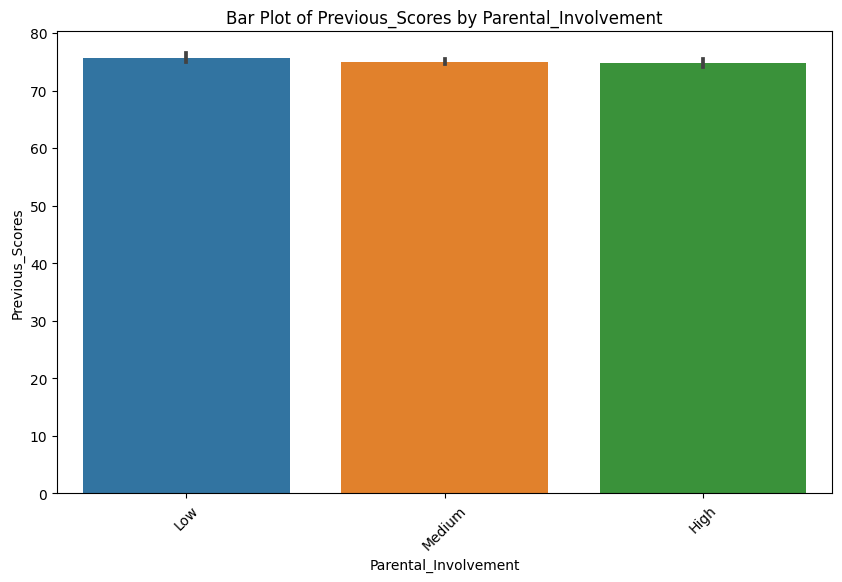

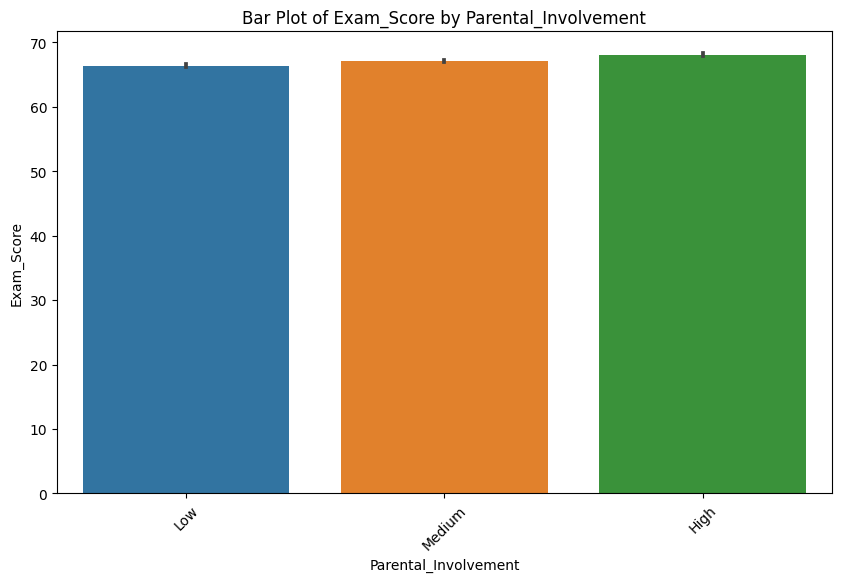

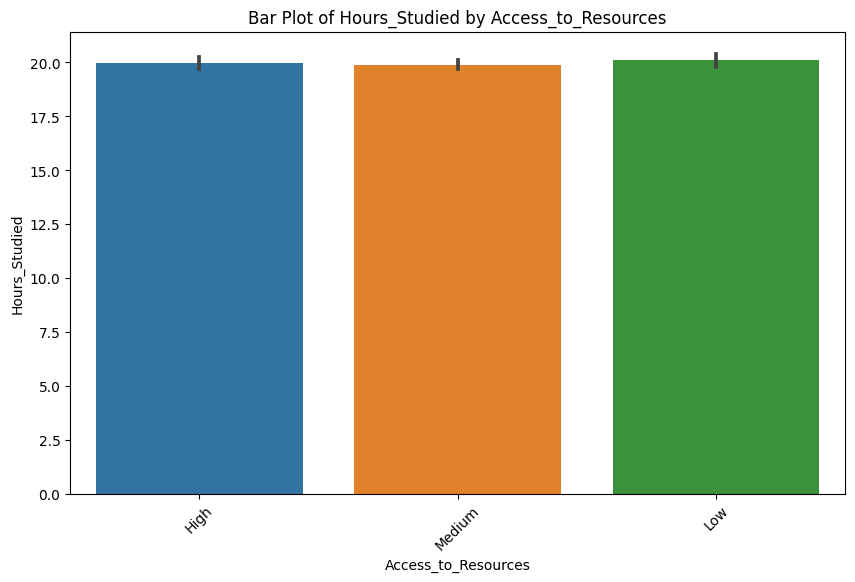

...

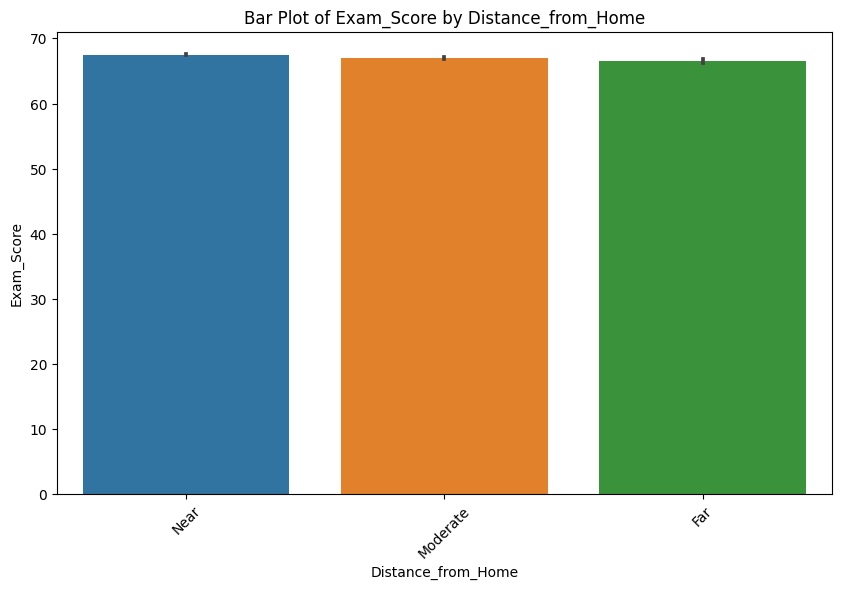

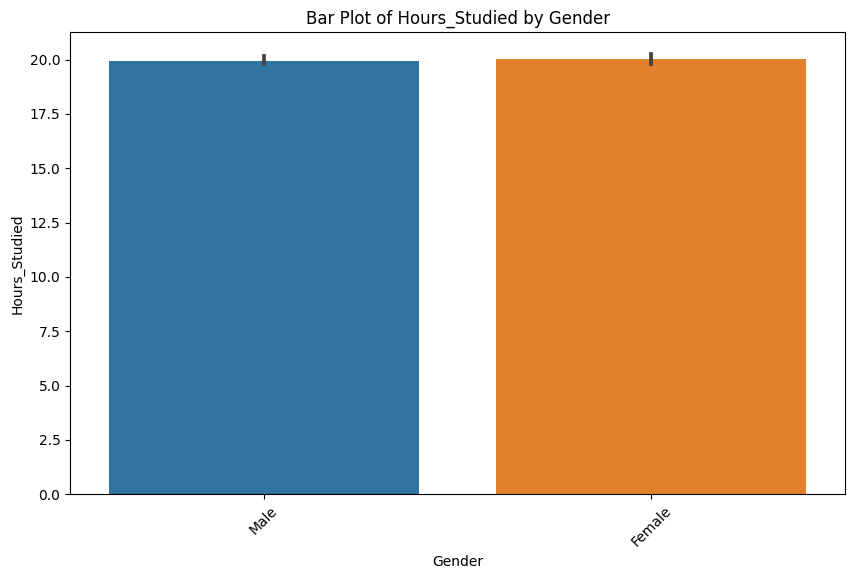

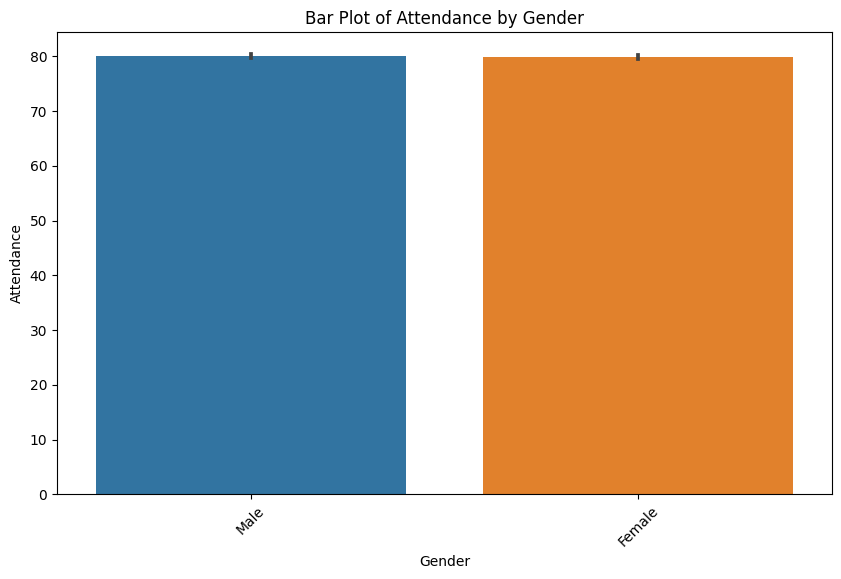

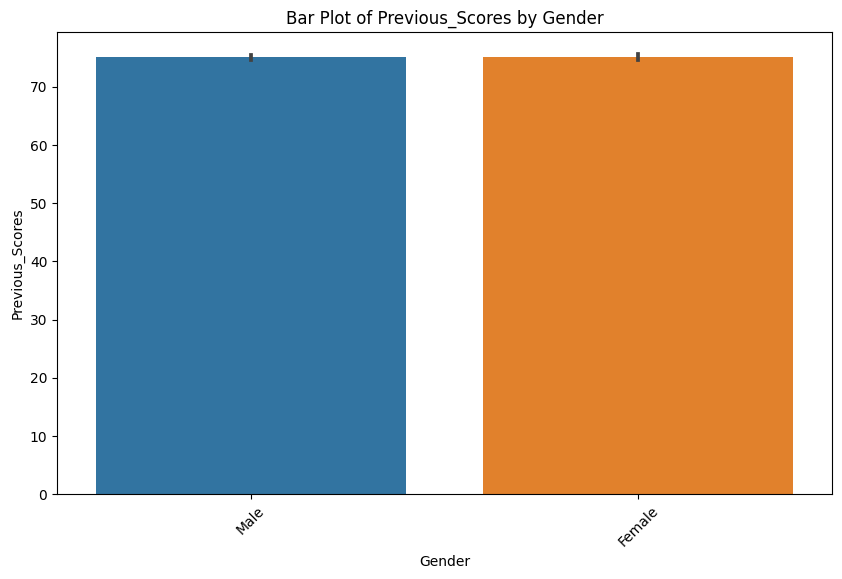

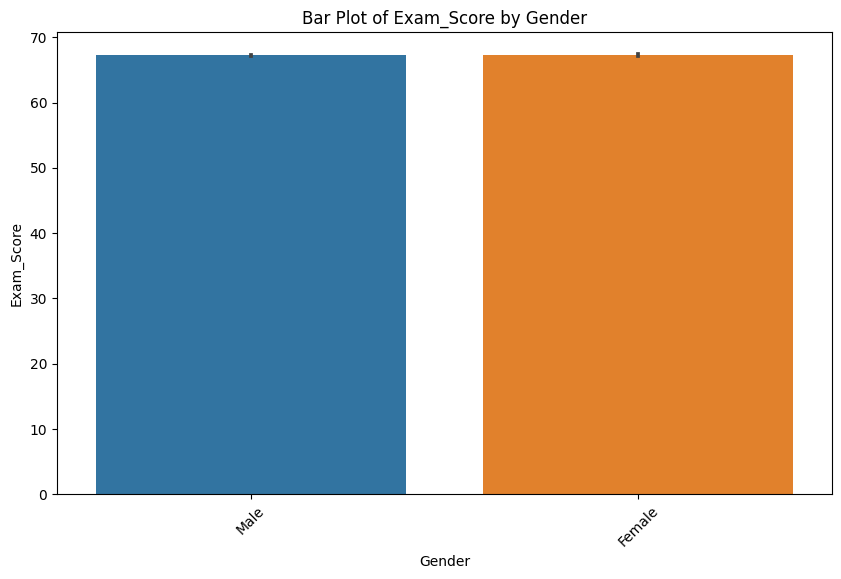

In [101]:
categorical_cols = ['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours', 
                    'Motivation_Level', 'Internet_Access', 'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 
                    'School_Type', 'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities', 
                    'Parental_Education_Level', 'Distance_from_Home', 'Gender']

numerical_cols = ['Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score']

for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.barplot(x=cat_col, y=num_col, data=df, estimator=np.mean)
        plt.title(f'Bar Plot of {num_col} by {cat_col}')
        plt.xticks(rotation=45)
        plt.show()

plotting boxplots

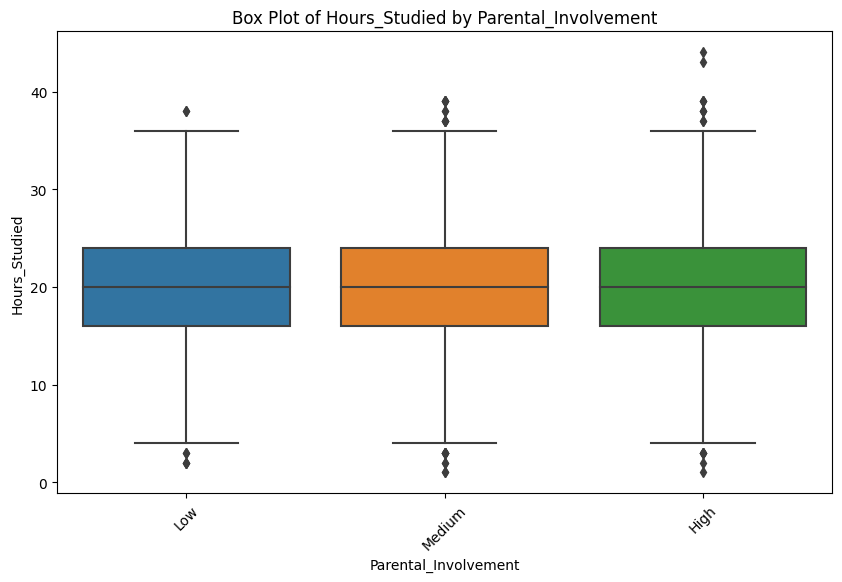

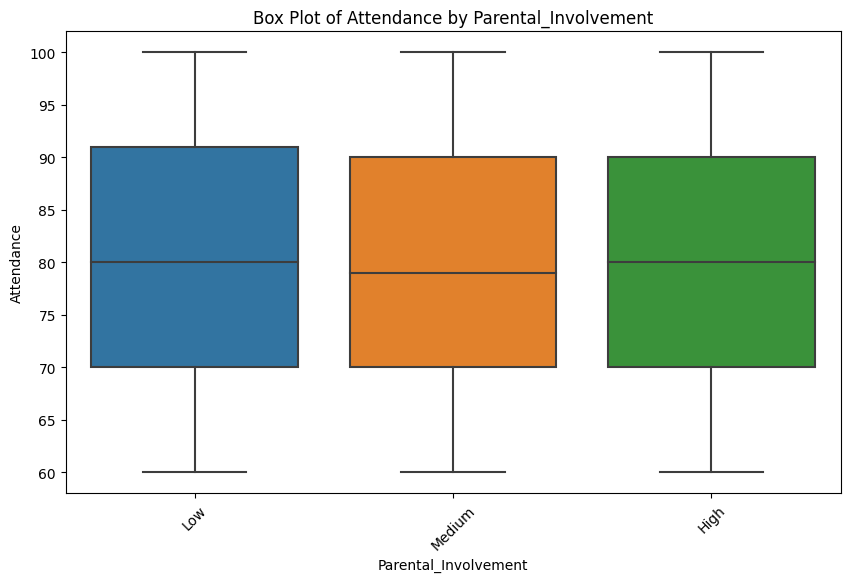

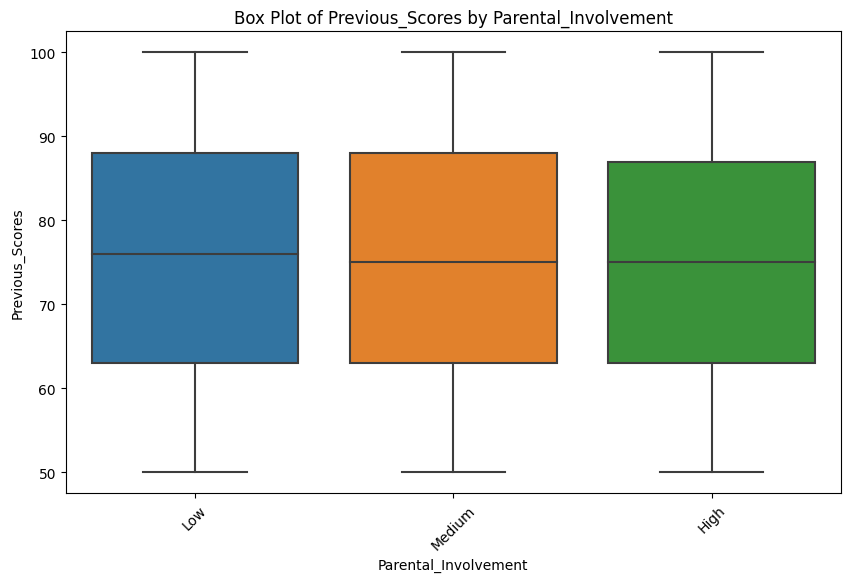

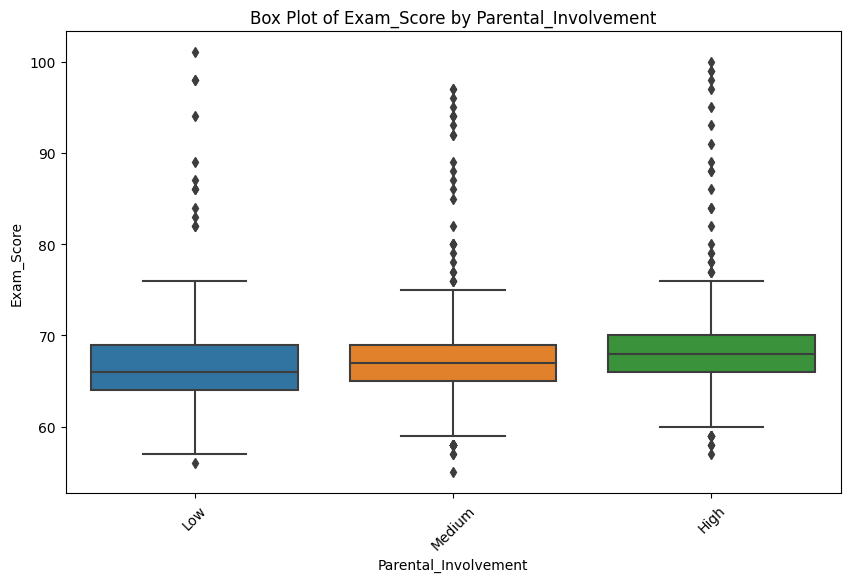

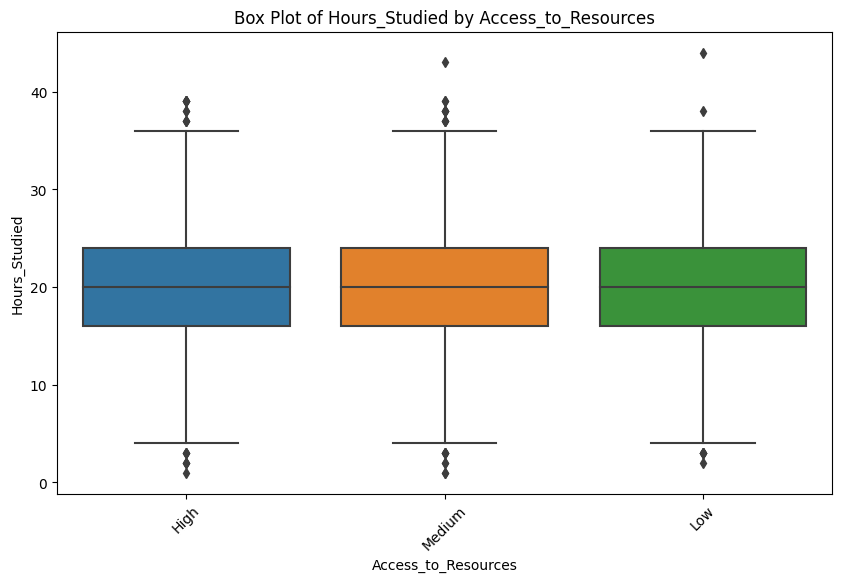

...

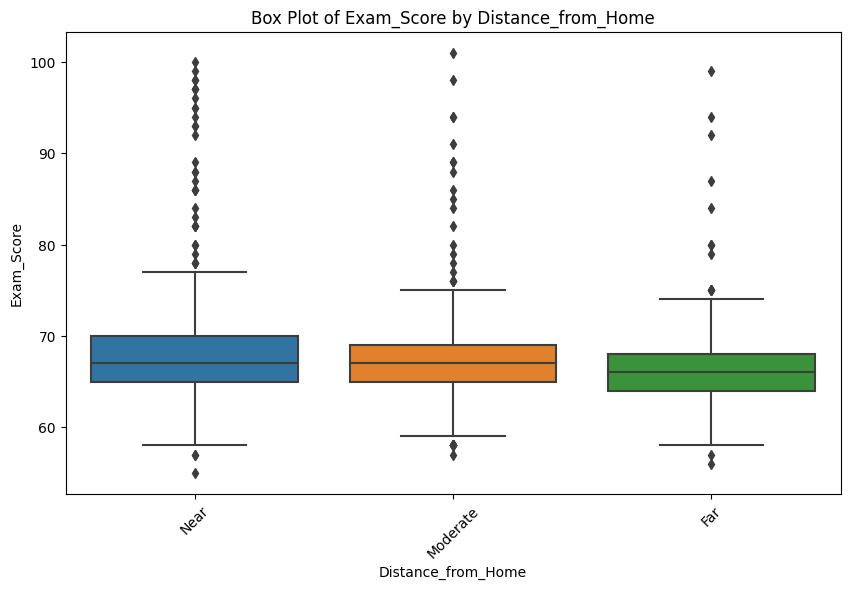

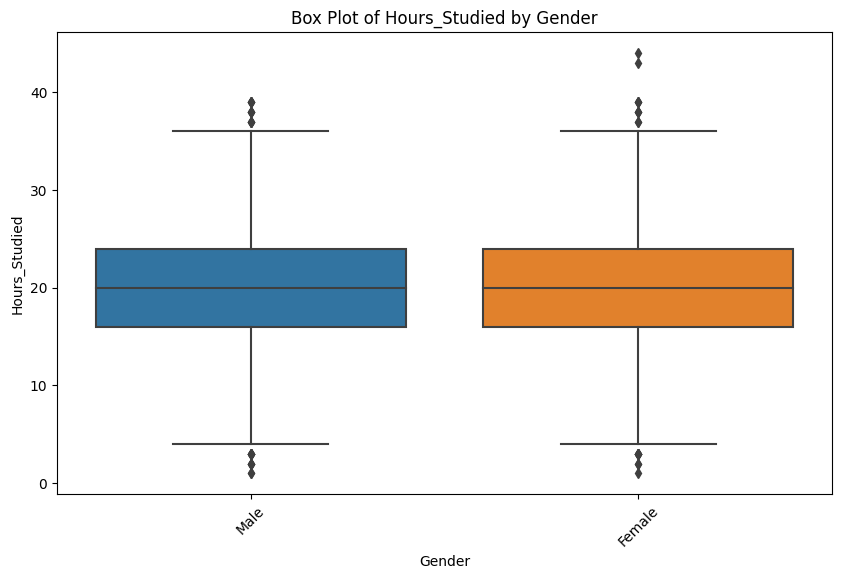

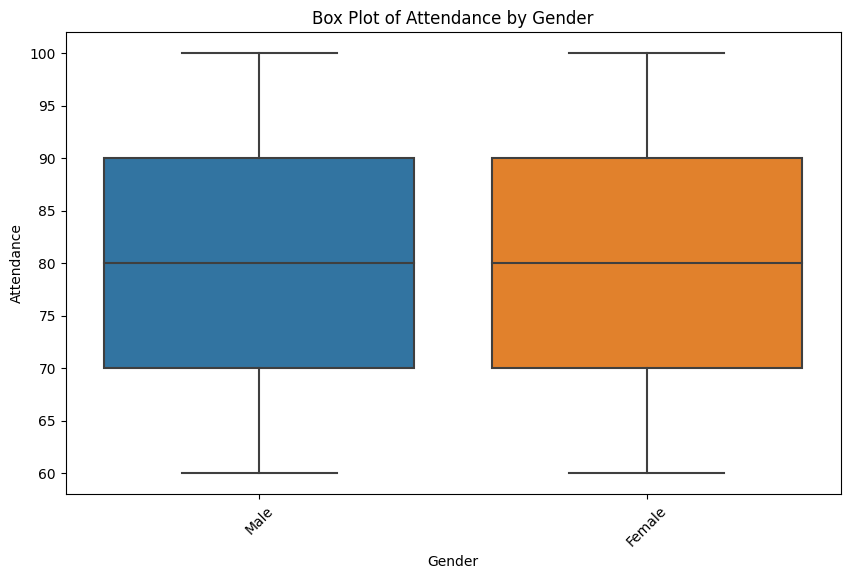

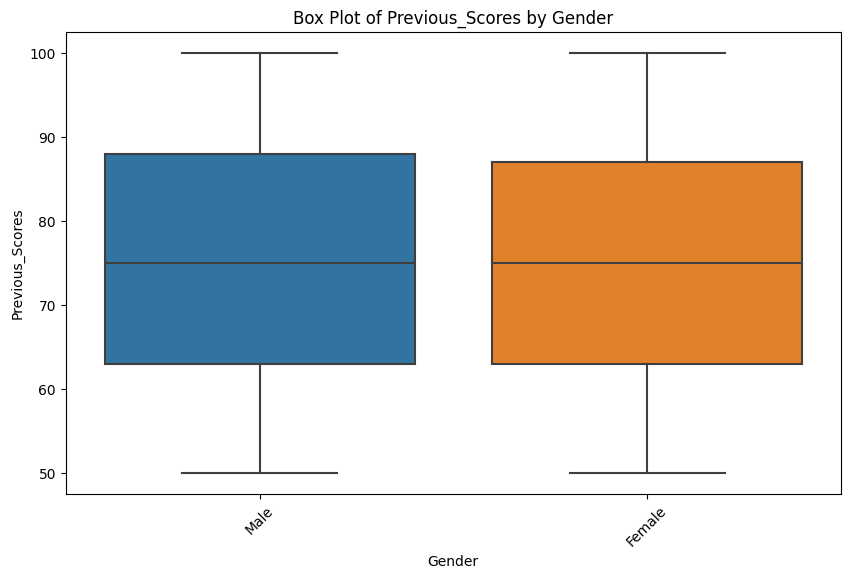

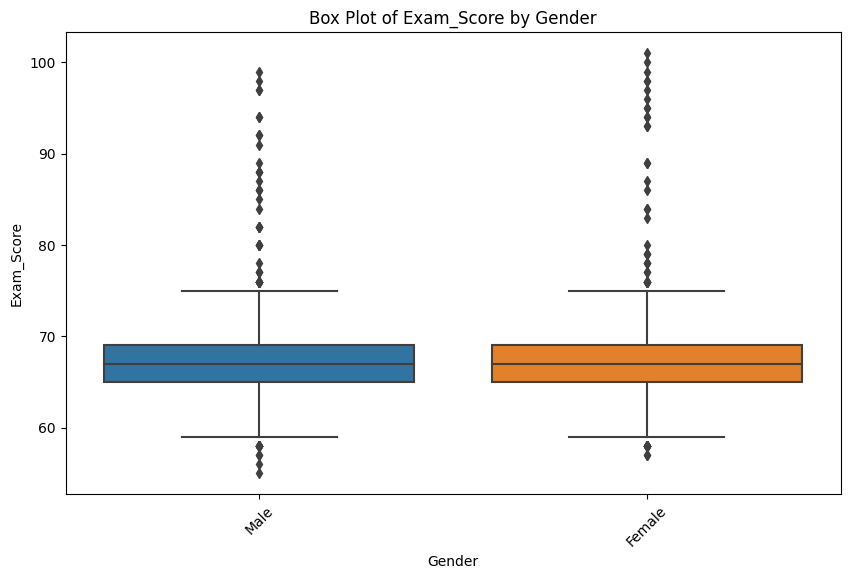

In [102]:
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Box Plot of {num_col} by {cat_col}')
        plt.xticks(rotation=45)
        plt.show()

Plotting violin plots

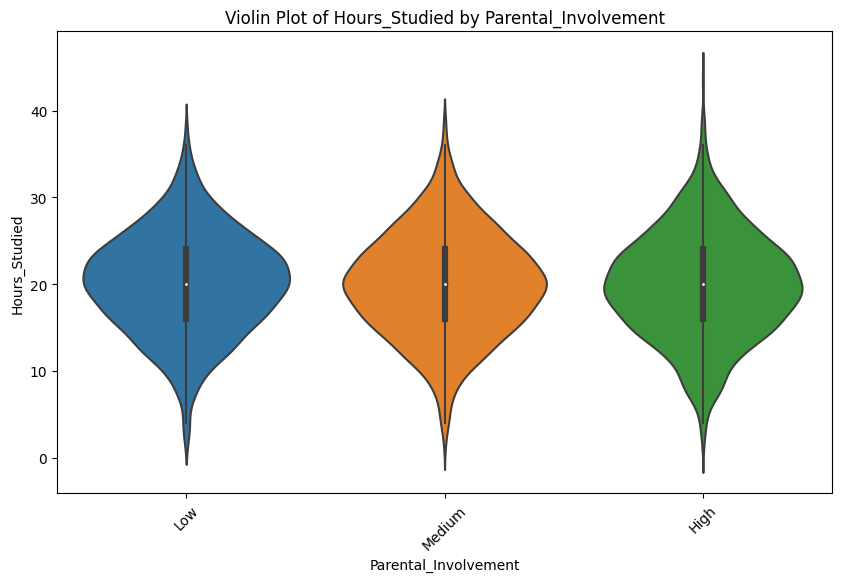

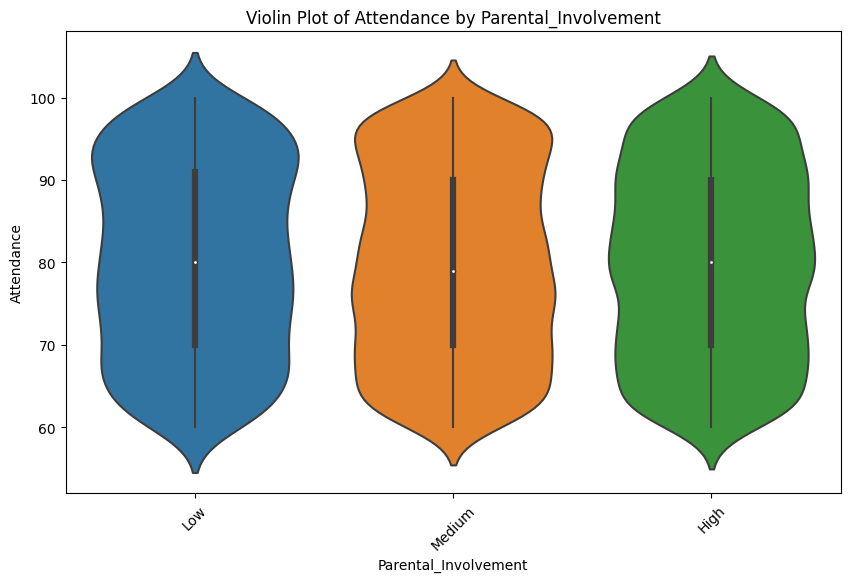

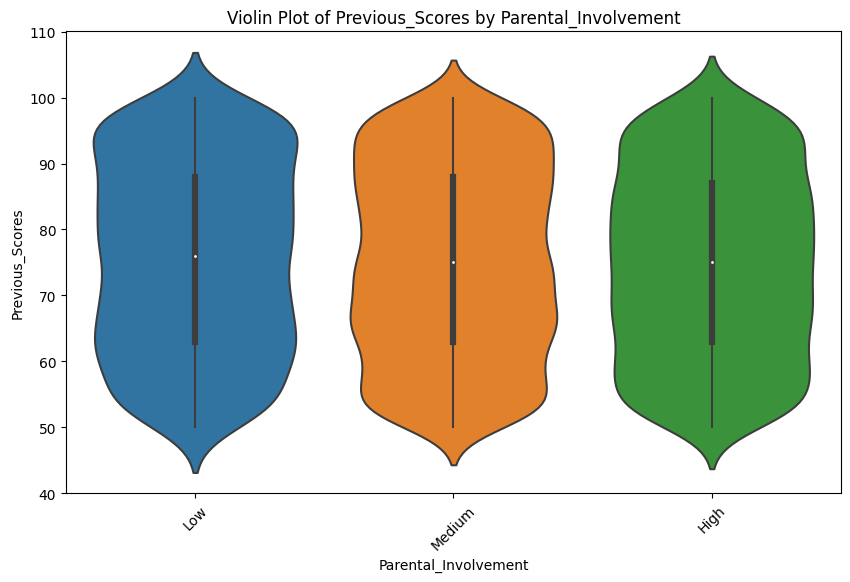

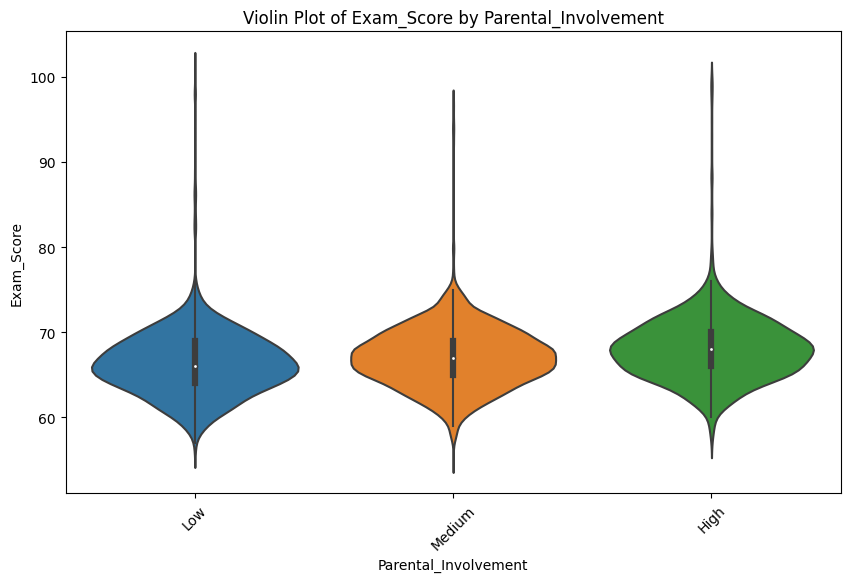

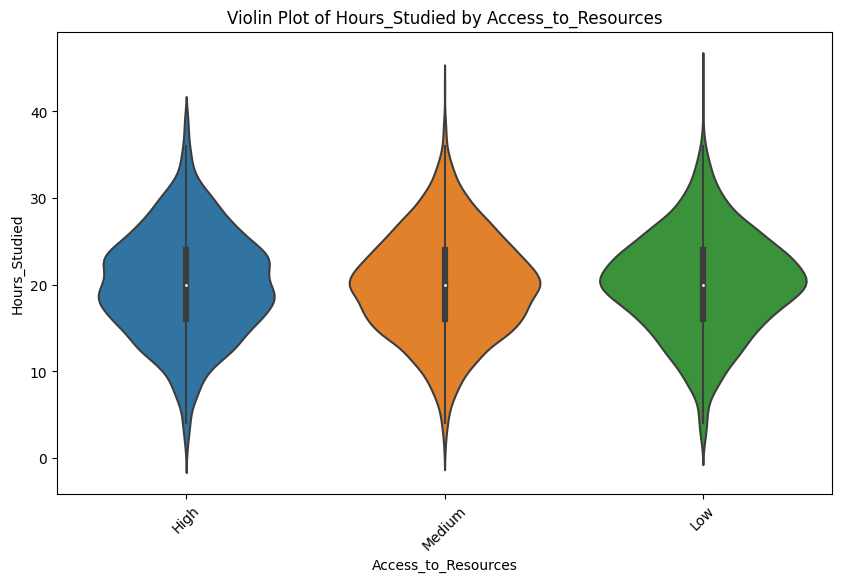

...

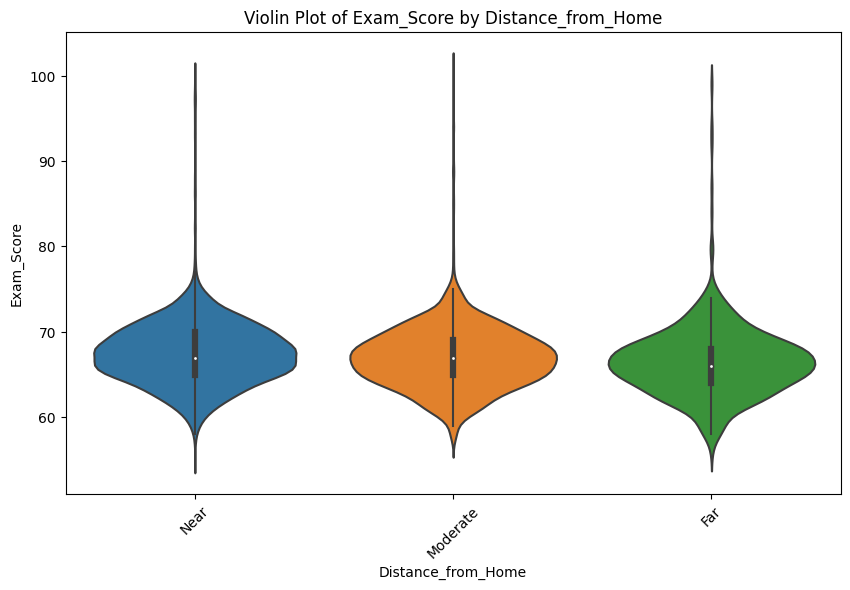

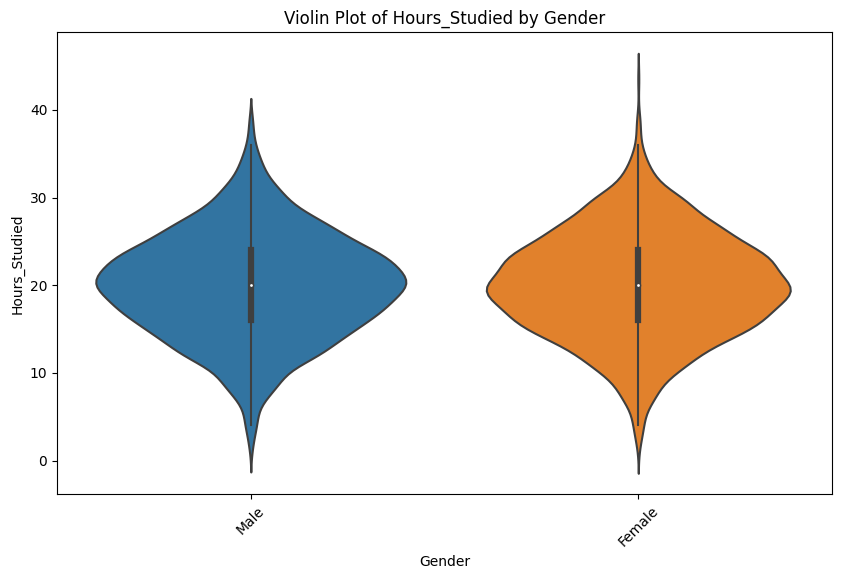

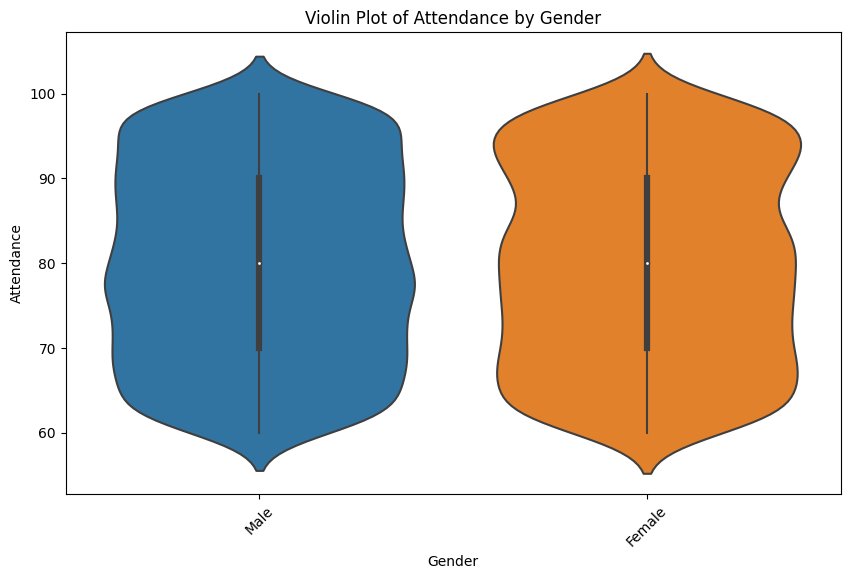

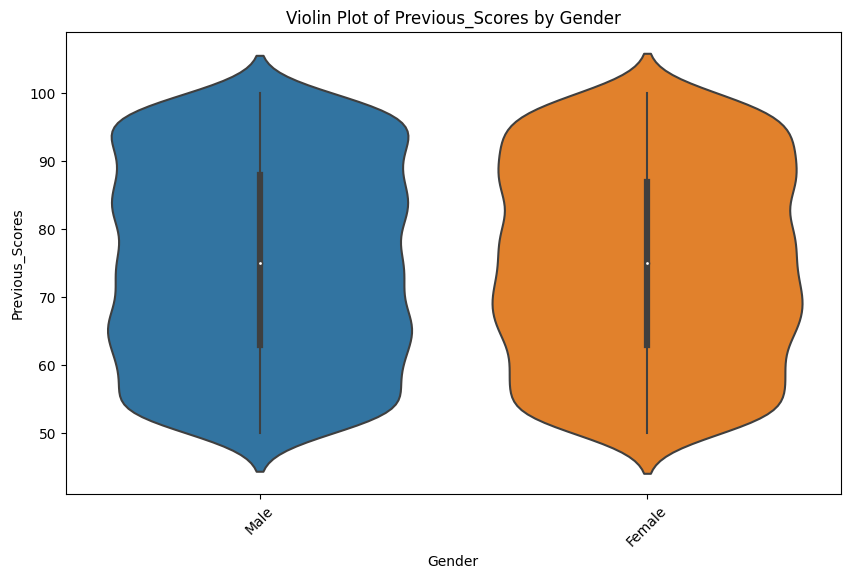

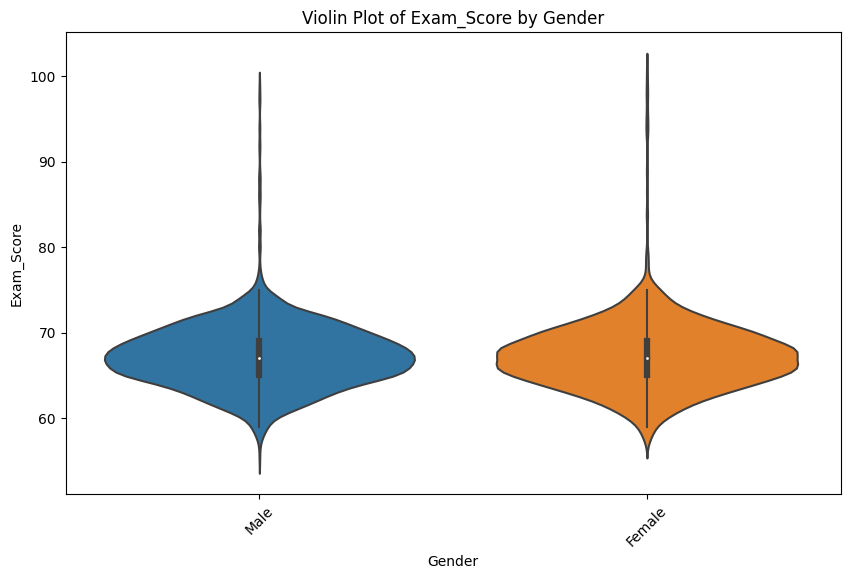

In [103]:
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.violinplot(x=cat_col, y=num_col, data=df)
        plt.title(f'Violin Plot of {num_col} by {cat_col}')
        plt.xticks(rotation=45)
        plt.show()

finding chi2_contingency to analyse the strength

In [104]:
for num_col in numerical_cols:
    df[num_col + '_binned'] = pd.qcut(df[num_col], q=4, labels=False)

# Running Chi-Square test for categorical vs binned numeric columns
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        contingency_table = pd.crosstab(df[cat_col], df[num_col + '_binned'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f'Chi-Square Test for {cat_col} and {num_col}:')
        print(f'Chi2: {chi2}, p-value: {p}, Degrees of Freedom: {dof}')
        print()

Chi-Square Test for Parental_Involvement and Hours_Studied:
Chi2: 3.872676653422133, p-value: 0.6939018451481691, Degrees of Freedom: 6

Chi-Square Test for Parental_Involvement and Attendance:
Chi2: 6.703187246156415, p-value: 0.3491703911043088, Degrees of Freedom: 6

Chi-Square Test for Parental_Involvement and Previous_Scores:
Chi2: 6.611868398412182, p-value: 0.35823610113559323, Degrees of Freedom: 6

Chi-Square Test for Parental_Involvement and Exam_Score:
Chi2: 163.4671702032745, p-value: 1.0913200654625337e-32, Degrees of Freedom: 6

Chi-Square Test for Access_to_Resources and Hours_Studied:
Chi2: 11.64539088421289, p-value: 0.07036366831994496, Degrees of Freedom: 6

Chi-Square Test for Access_to_Resources and Attendance:
Chi2: 10.624898852120795, p-value: 0.10068456251831642, Degrees of Freedom: 6

Chi-Square Test for Access_to_Resources and Previous_Scores:
Chi2: 9.41386392301941, p-value: 0.15160543388049216, Degrees of Freedom: 6

Chi-Square Test for Access_to_Resources a

Categorical-Categorical

Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score'

In [105]:
pd.crosstab(df['Hours_Studied'],df['Attendance'])

Attendance,60,61,62,63,64,65,66,67,68,69,...,91,92,93,94,95,96,97,98,99,100
Hours_Studied,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,2,1,0
3,2,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,2,0,0,1,0
4,1,2,1,0,1,0,1,0,0,2,...,1,0,0,0,0,0,0,0,0,2
5,0,1,1,0,0,2,0,0,0,1,...,0,1,2,0,1,1,1,0,0,0
6,0,0,0,0,0,1,1,1,0,1,...,0,1,1,0,1,0,0,1,0,0
7,1,1,3,2,2,0,1,0,1,3,...,1,2,1,1,0,3,1,2,2,0
8,1,2,0,0,2,2,1,3,1,0,...,1,0,0,1,1,1,3,1,3,2
9,1,2,2,0,3,3,1,1,0,3,...,3,0,2,2,1,3,2,4,0,1


In [106]:
categorical_cols = ['Hours_Studied', 'Attendance', 'Previous_Scores', 'Exam_Score']

# Generate and display contingency tables
for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 != col2:
            contingency_table = pd.crosstab(df[col1], df[col2])
            print(f'Contingency Table for {col1} and {col2}:')
            print(contingency_table)
            print()

Contingency Table for Hours_Studied and Attendance:
Attendance     60   61   62   63   64   65   66   67   68   69   ...  91   \
Hours_Studied                                                    ...        
1                0    0    0    0    0    0    0    0    0    1  ...    0   
2                0    0    0    0    0    0    0    1    0    0  ...    0   
3                2    0    1    0    0    0    0    0    0    0  ...    0   
4                1    2    1    0    1    0    1    0    0    2  ...    1   
5                0    1    1    0    0    2    0    0    0    1  ...    0   
6                0    0    0    0    0    1    1    1    0    1  ...    0   
7                1    1    3    2    2    0    1    0    1    3  ...    1   
8                1    2    0    0    2    2    1    3    1    0  ...    1   
9                1    2    2    0    3    3    1    1    0    3  ...    3   
10               2    2    3    3    3    1    2    4    1    2  ...    1   
11               1    5 

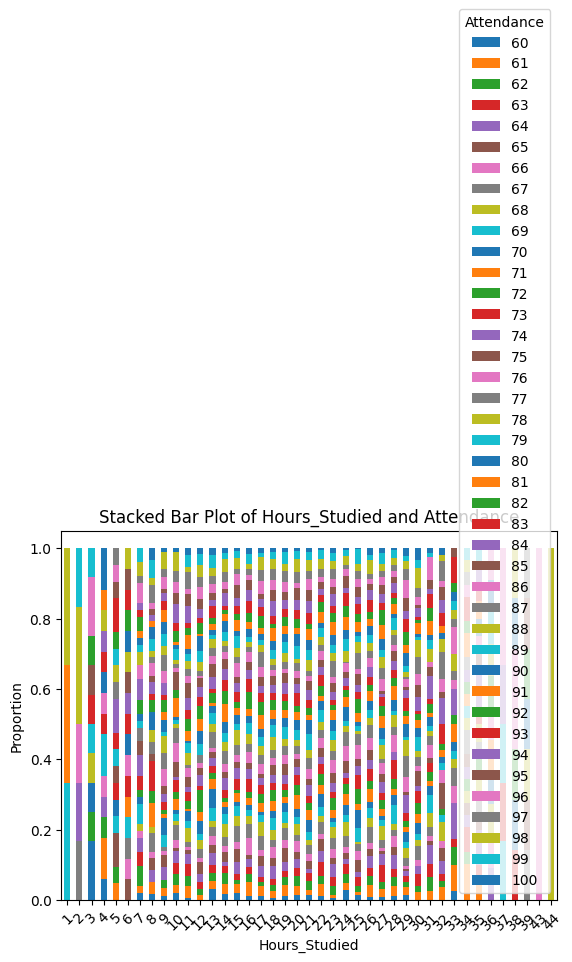

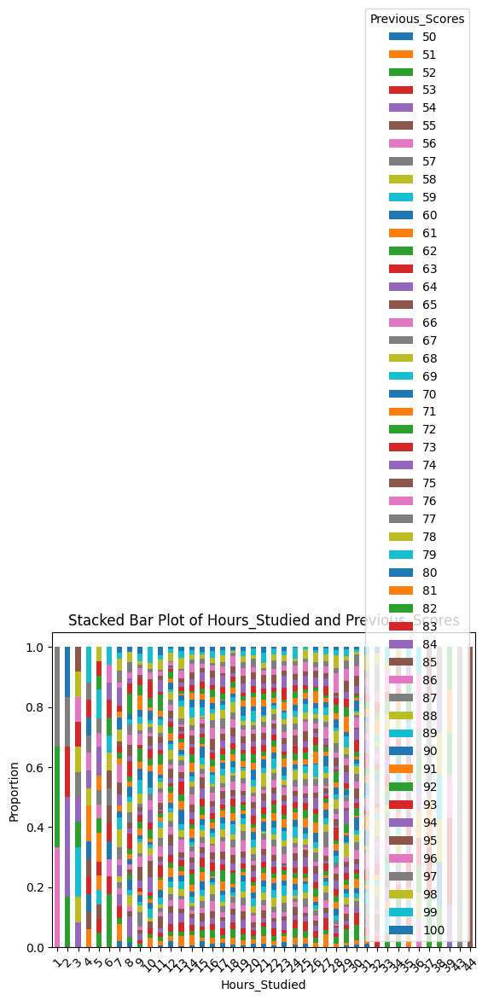

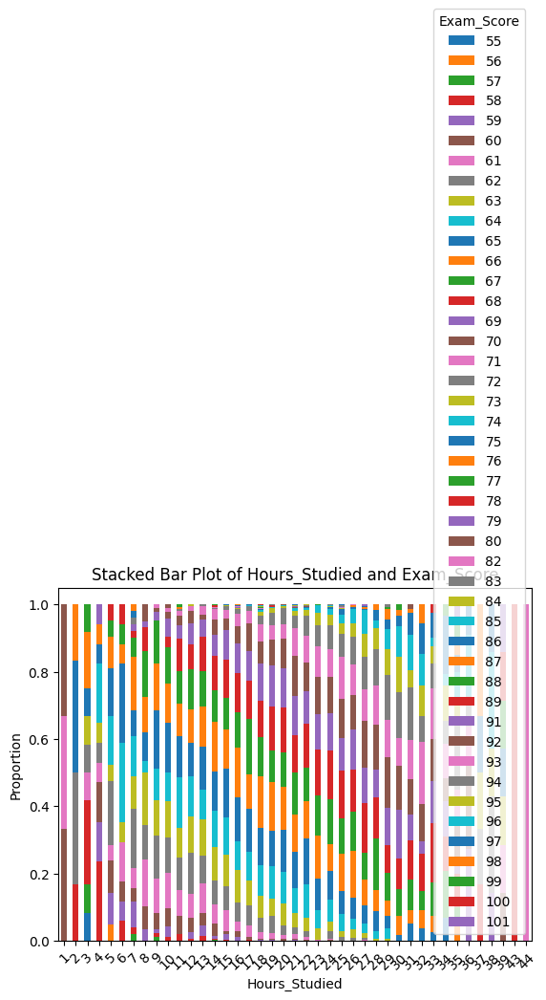

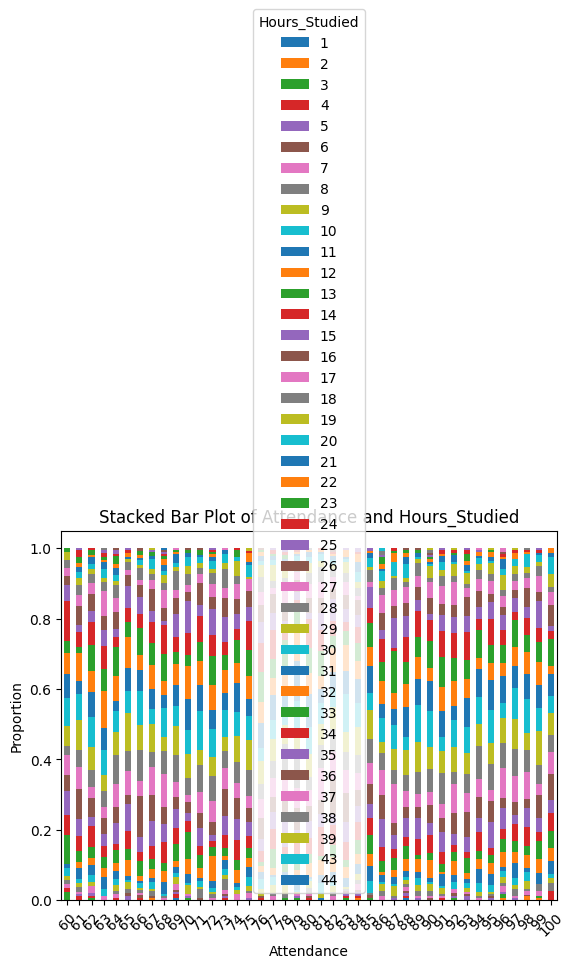

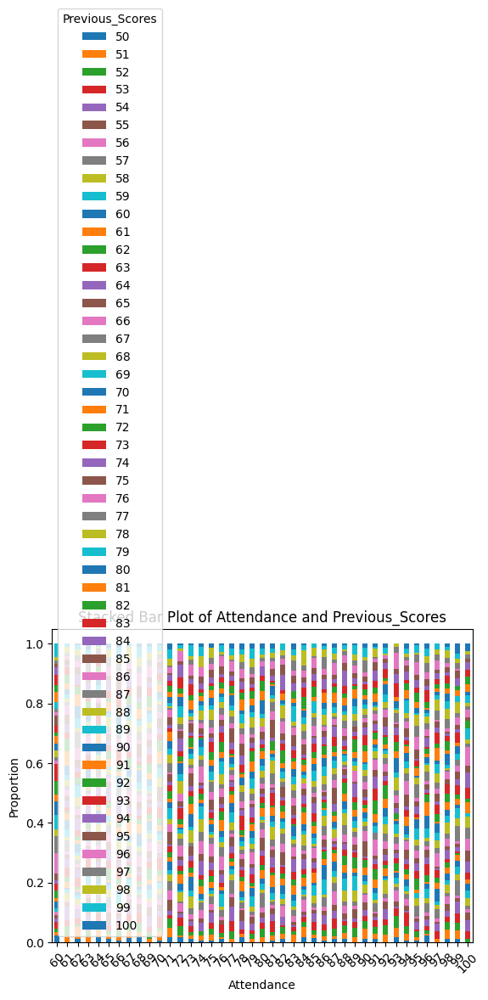

...

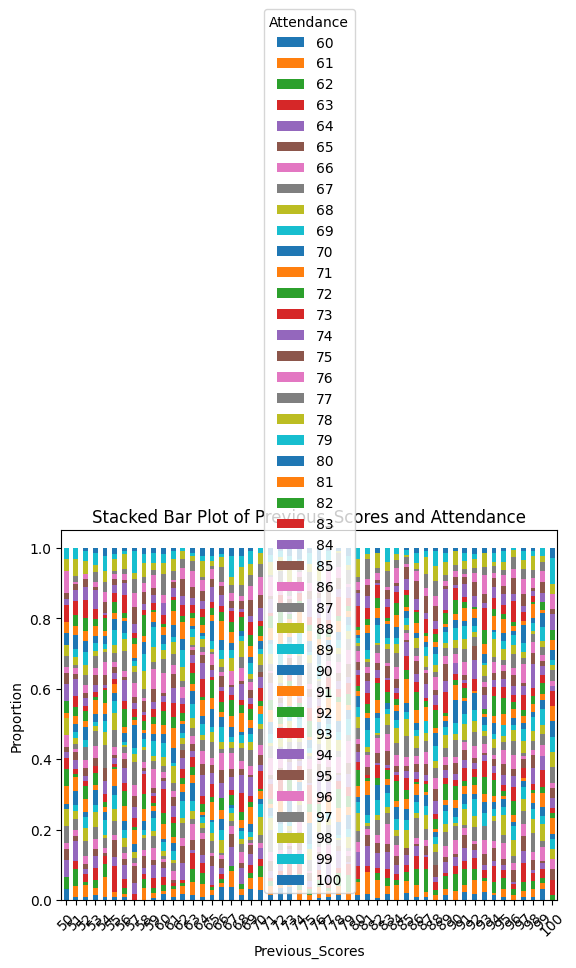

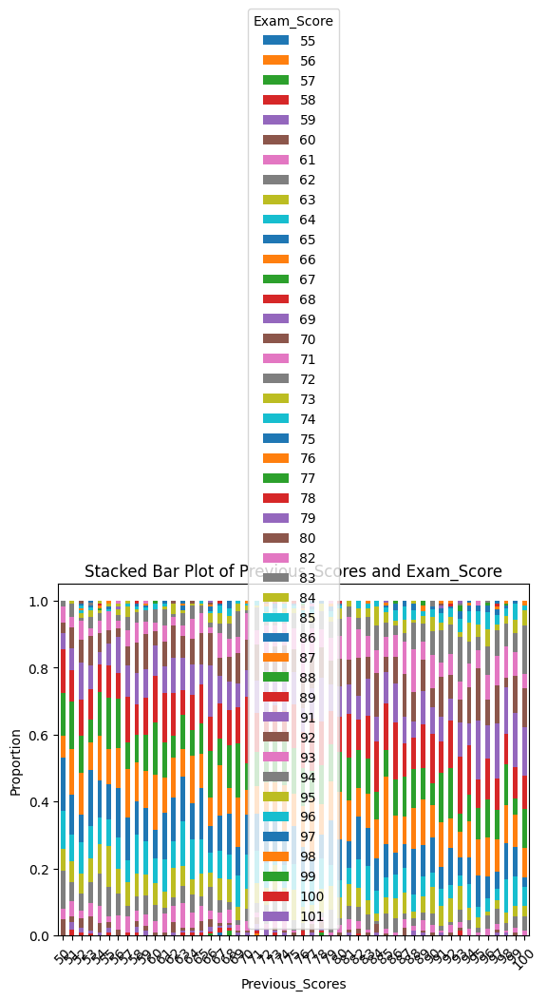

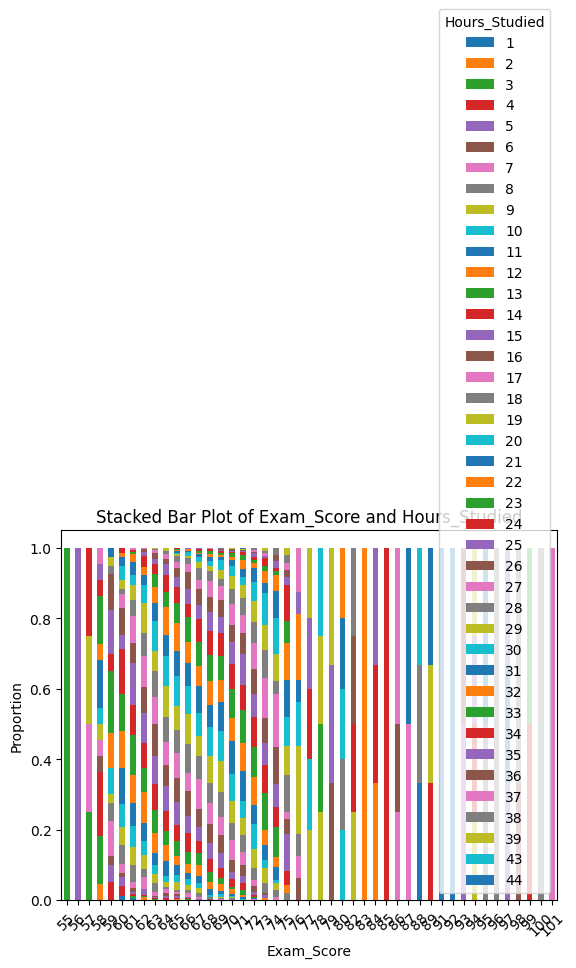

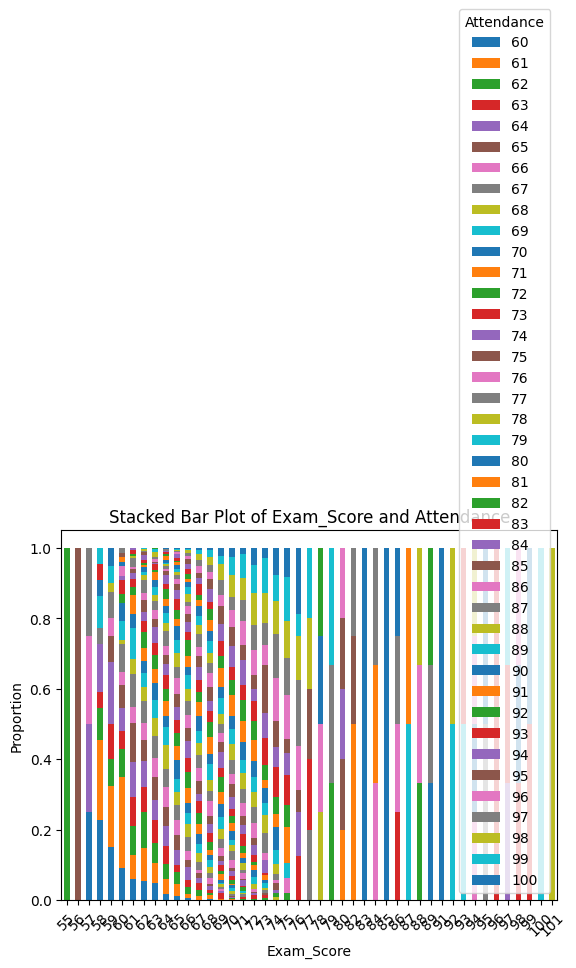

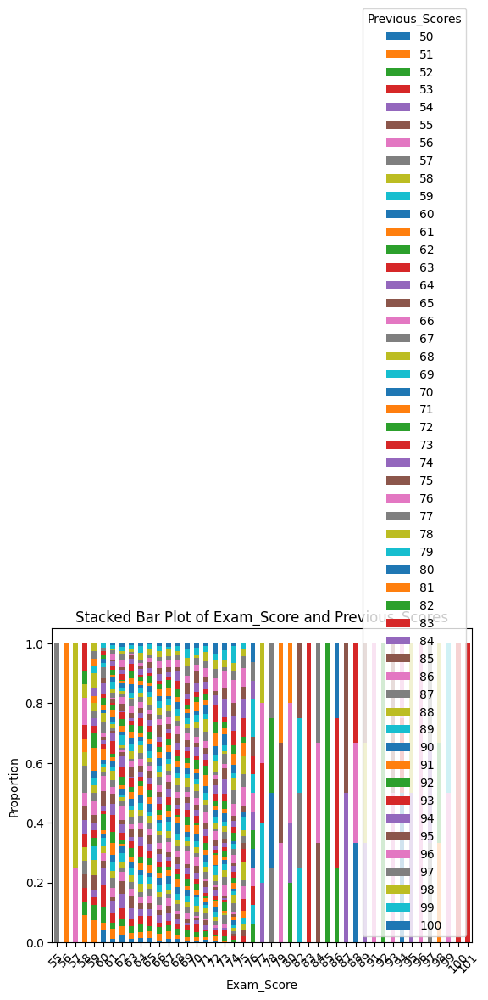

In [107]:
for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 != col2:
            cross_tab = pd.crosstab(df[col1], df[col2], normalize='index')
            cross_tab.plot(kind='bar', stacked=True)
            plt.title(f'Stacked Bar Plot of {col1} and {col2}')
            plt.xlabel(col1)
            plt.ylabel('Proportion')
            plt.xticks(rotation=45)
            plt.show()

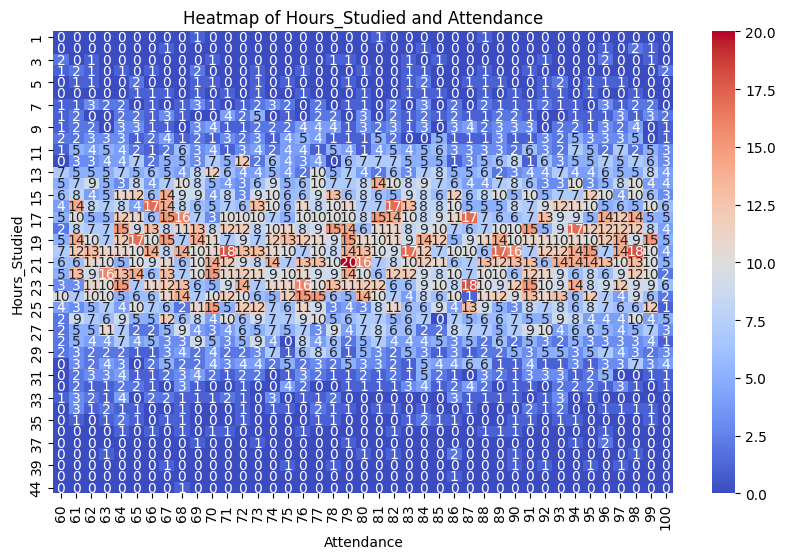

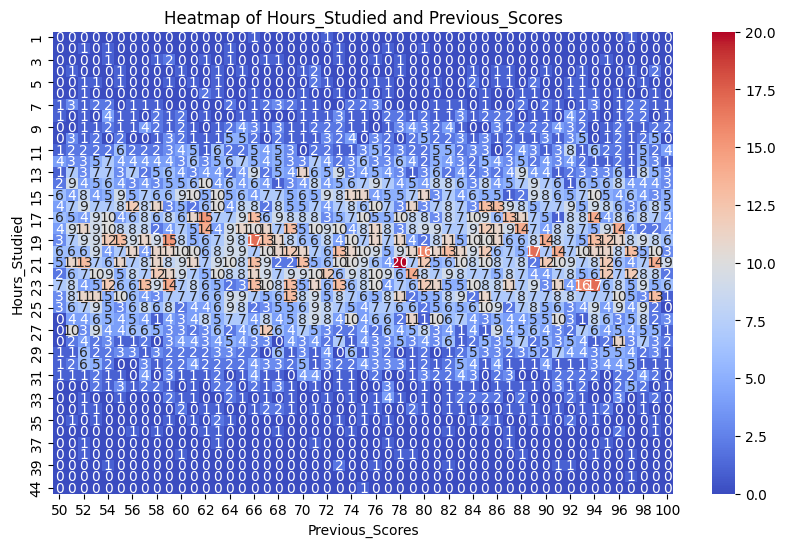

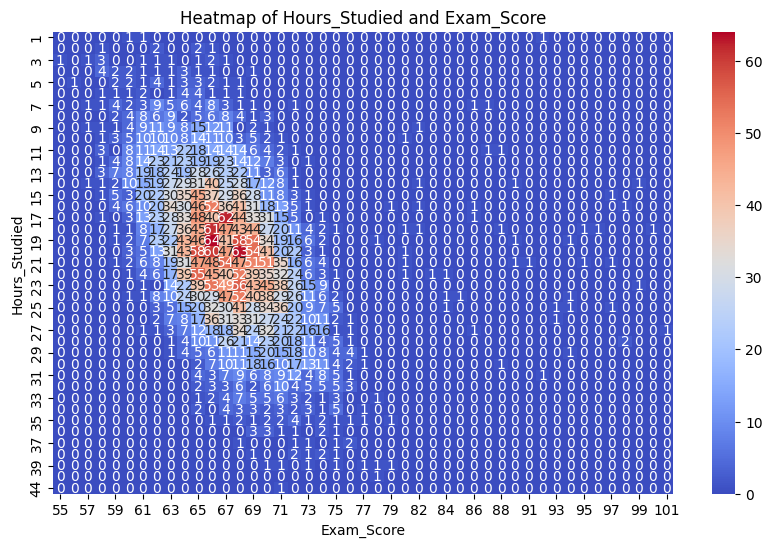

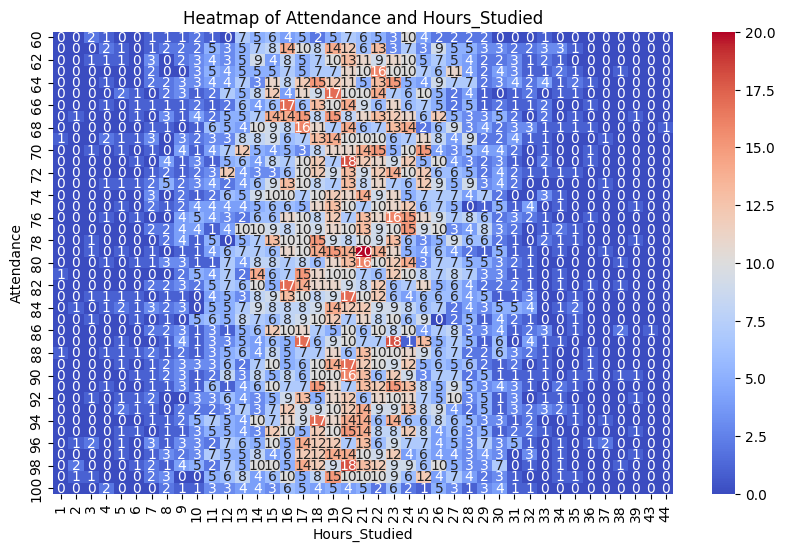

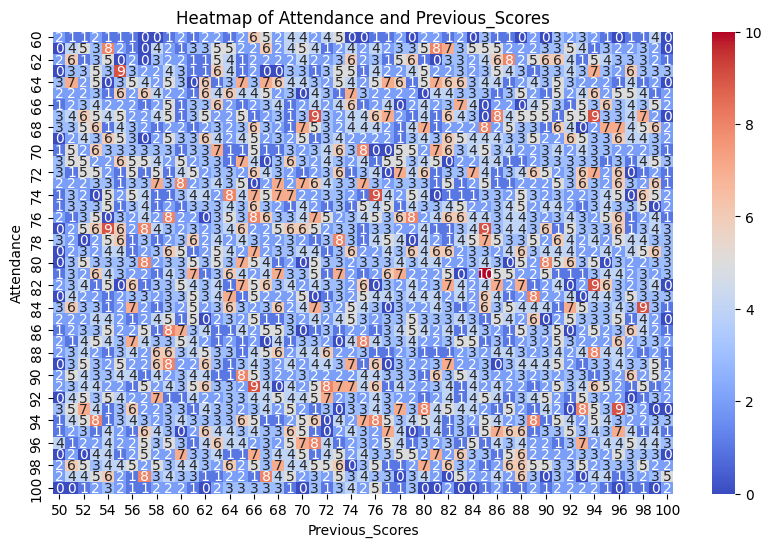

...

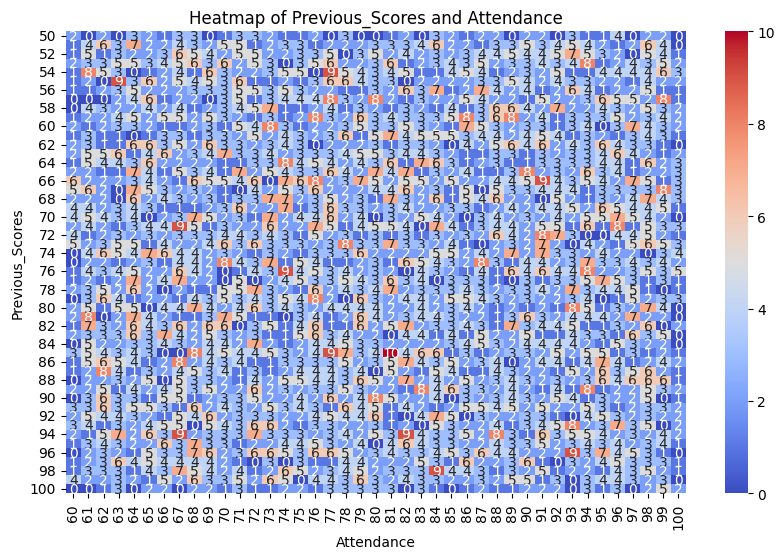

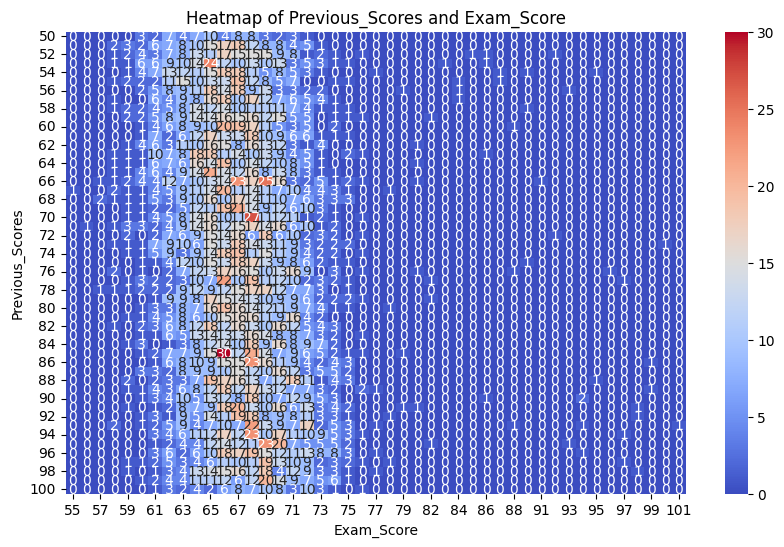

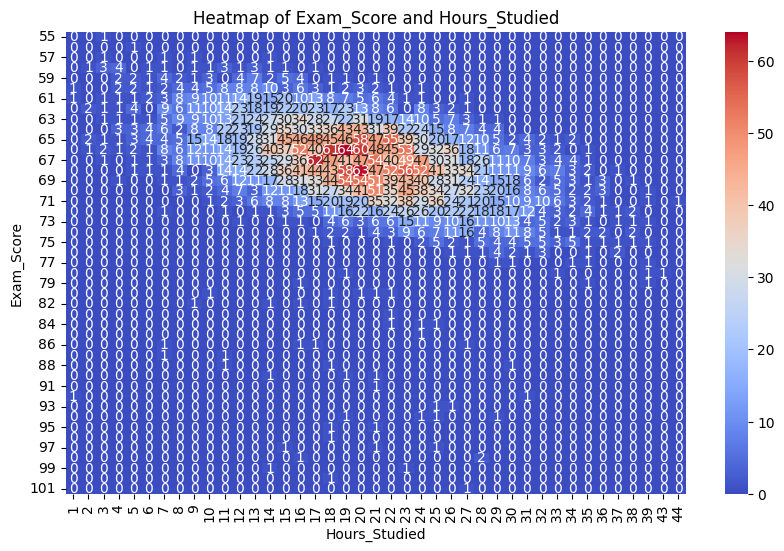

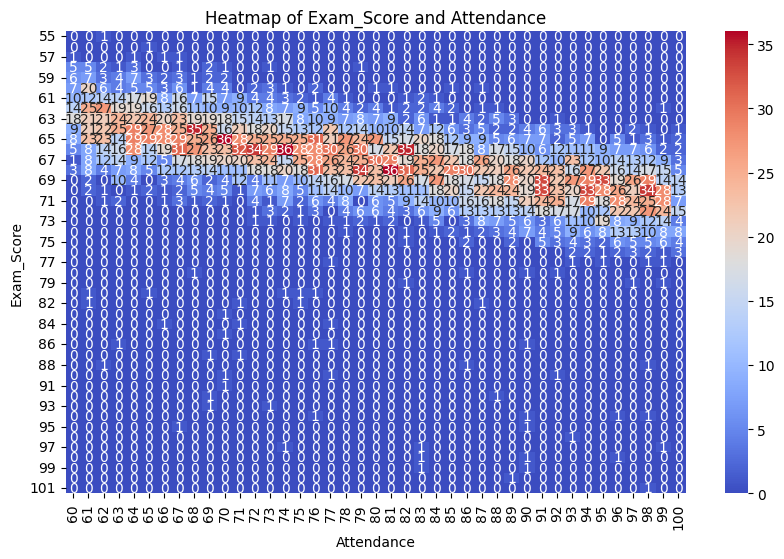

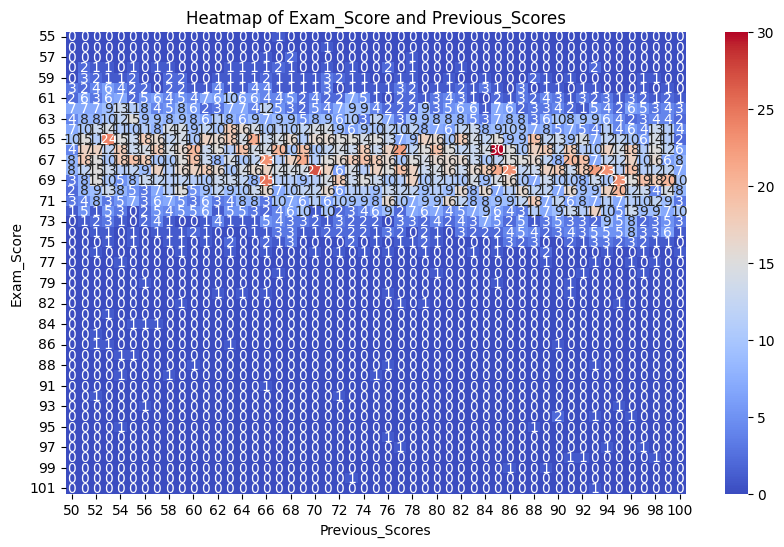

In [108]:
for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 != col2:
            contingency_table = pd.crosstab(df[col1], df[col2])
            plt.figure(figsize=(10, 6))
            sns.heatmap(contingency_table, annot=True, fmt='d', cmap='coolwarm')
            plt.title(f'Heatmap of {col1} and {col2}')
            plt.xlabel(col2)
            plt.ylabel(col1)
            plt.show()

In [110]:
for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 != col2:
            contingency_table = pd.crosstab(df[col1], df[col2])
            chi2, p, dof, expected = chi2_contingency(contingency_table)
            print(f'Chi-Square Test between {col1} and {col2}:')
            print(f'Chi2: {chi2}, p-value: {p}, Degrees of Freedom: {dof}')
            print()

Chi-Square Test between Hours_Studied and Attendance:
Chi2: 1521.9935226688117, p-value: 0.9177672269309419, Degrees of Freedom: 1600

Chi-Square Test between Hours_Studied and Previous_Scores:
Chi2: 1969.6948154025276, p-value: 0.6811990269272041, Degrees of Freedom: 2000

Chi-Square Test between Hours_Studied and Exam_Score:
Chi2: 9134.194702692468, p-value: 0.0, Degrees of Freedom: 1760

Chi-Square Test between Attendance and Hours_Studied:
Chi2: 1521.9935226688117, p-value: 0.9177672269309419, Degrees of Freedom: 1600

Chi-Square Test between Attendance and Previous_Scores:
Chi2: 1955.6559587965357, p-value: 0.7567323630833982, Degrees of Freedom: 2000

Chi-Square Test between Attendance and Exam_Score:
Chi2: 5596.168448850054, p-value: 0.0, Degrees of Freedom: 1760

Chi-Square Test between Previous_Scores and Hours_Studied:
Chi2: 1969.6948154025274, p-value: 0.6811990269272054, Degrees of Freedom: 2000

Chi-Square Test between Previous_Scores and Attendance:
Chi2: 1955.65595879653

Conclusions


Correlation Insights:
Hours_Studied vs. Exam_Score:

There is a moderate positive correlation of 0.45. This indicates that more study hours generally lead to better exam scores, but other factors also influence outcomes.
Attendance vs. Exam_Score:

A strong positive correlation of 0.58 suggests that higher attendance significantly improves exam performance. Regular attendance is a key factor in success.
Previous_Scores vs. Exam_Score:

A weak positive correlation of 0.18 shows that past academic performance has some influence on current exam scores, though it's not the only determinant.
Sleep_Hours vs. Exam_Score:

There is almost no correlation (-0.017) between sleep hours and exam scores, suggesting that sleep patterns alone do not heavily influence scores.
Tutoring_Sessions vs. Exam_Score:

A weak positive correlation of 0.16 indicates that more tutoring sessions slightly improve exam scores, but it's not a major influence.
Physical_Activity vs. Exam_Score:

A negligible correlation (0.03) shows that physical activity has little direct influence on exam performance, though it might have indirect health benefits.

Interaction with Motivation_Level: Motivated students are likely to attend school more regularly, which strengthens their academic performance.

Attendance has Direct Influence on Exam_Scores: As seen in the dataset, students who attend school more regularly tend to perform better in exams.
